In [94]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from catboost import CatBoostClassifier, Pool

from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.datasets import load_breast_cancer
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = load_breast_cancer()
df = pd.DataFrame(data=data.data, columns=data.feature_names)
df['target'] = data.target
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

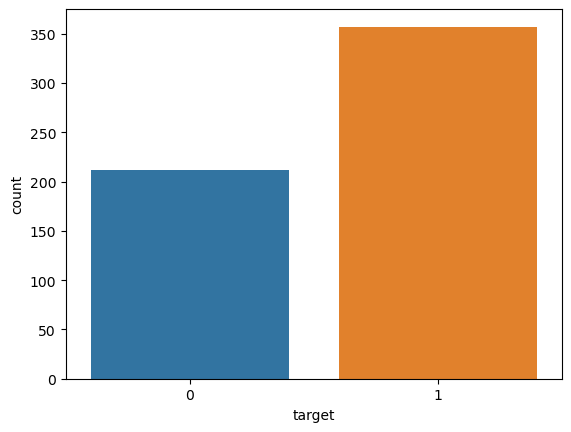

In [4]:
sns.countplot(x = df.target)
plt.show()

* Видим явный дисбаланс классов, также в датасете всего 589 наблюдений, поэтому хорошим решением будет использование стратификированного к фолд кросс валидацию.

In [5]:
skf = StratifiedKFold(n_splits=6, shuffle = True, random_state = 1)

In [6]:
X = df.drop(['target'], axis=1)
y = df['target']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size = 0.35, 
                                                    random_state = 1, 
                                                    shuffle=True, 
                                                    stratify=y)

* тест сайз поставим 0.35, так как у нас мало данных и хочется получить более объективные метрики.

In [100]:
scaler = MinMaxScaler()
pca = PCA()
logreg = LogisticRegression(max_iter=1000, tol=0.001)
knc = KNeighborsClassifier()
rfc = RandomForestClassifier(max_features='sqrt')
booster = CatBoostClassifier(loss_function='Logloss')


pipe_logreg = Pipeline(steps=[('scaler', scaler), 
                              ('pca', pca), 
                              ('logreg', logreg)])

pipe_rfc = Pipeline(steps=[('scaler', scaler), 
                           ('rfc', rfc)])

pipe_knc = Pipeline(steps=[('scaler', scaler),
                           ('knc', knc)])

pipe_booster = Pipeline(steps=[('scaler', scaler), 
                               ('booster', booster)])

* обучим случайный лес, кнн, логистическую регрессию и катбуст(градиентный бустинг над деревьями). Для логистической регрессии, так как довольно много признаков(30), используем pca - численный метод понижения размерности, для остальных моделей pca в целом применять не нужно, так как они не являюстя линейныйми.

In [101]:
param_grid_logreg = {
    'pca__n_components': [int(x) for x in range(1,31)],
    'logreg__C': np.logspace(-4, 4, 4),
    'logreg__solver': ['lbfgs', 'liblinear']
}

search_logreg = GridSearchCV(pipe_logreg, param_grid_logreg, n_jobs=-1, cv = skf, verbose=1)
search_logreg.fit(X_train, y_train)
print('Best parameter (CV score_train_logreg=%0.3f):' % search_logreg.best_score_)
print(search_logreg.best_params_)

Fitting 6 folds for each of 240 candidates, totalling 1440 fits
Best parameter (CV score_train_logreg=0.984):
{'logreg__C': 21.54434690031882, 'logreg__solver': 'lbfgs', 'pca__n_components': 11}


In [102]:
param_grid_knc = {
    'knc__n_neighbors':[int(x) for x in range(2, 30)],
    'knc__weights': ['uniform', 'distance'],
    'knc__algorithm':['ball_tree', 'kd_tree', 'brute']
}
search_knc = GridSearchCV(pipe_knc, param_grid_knc, n_jobs=-1, cv = skf, verbose=1)
search_knc.fit(X_train, y_train)
print('Best parameter (CV score_train_knc=%0.3f):' % search_knc.best_score_)
print(search_knc.best_params_)

Fitting 6 folds for each of 168 candidates, totalling 1008 fits
Best parameter (CV score_train_knc=0.976):
{'knc__algorithm': 'ball_tree', 'knc__n_neighbors': 3, 'knc__weights': 'uniform'}


In [21]:
param_grid_rfc = {
    'rfc__n_estimators': [int(x) for x in range(100, 551, 50)],
    'rfc__max_depth': [int(x) for x in range(3, 13, 2)]
}
search_rfc = GridSearchCV(pipe_rfc, param_grid_rfc, n_jobs=-1, cv = skf, verbose=1)
search_rfc.fit(X_train, y_train)
print('Best parameter (CV score_train_rfc=%0.3f):' % search_rfc.best_score_)
print(search_rfc.best_params_)

Fitting 6 folds for each of 50 candidates, totalling 300 fits
Best parameter (CV score_train_rfc=0.965):
{'rfc__max_depth': 5, 'rfc__n_estimators': 250}


In [25]:
param_grid_booster = {
    'booster__iterations':[int(x) for x in range(50, 401, 50)],
    'booster__learning_rate': [x / 100.0 for x in range(5,50,10)],
    'booster__depth':[int(x) for x in range(6,11,2)]
}
search_booster = GridSearchCV(pipe_booster, param_grid_booster, n_jobs=-1, cv = skf)
search_booster.fit(X_train, y_train)
print('Best parameter (CV score_train_booster=%0.3f):' % search_booster.best_score_)
print(search_booster.best_params_)

0:	learn: 0.5070077	total: 64.7ms	remaining: 3.17s
1:	learn: 0.3676010	total: 72.5ms	remaining: 1.74s
2:	learn: 0.2829615	total: 83.6ms	remaining: 1.31s
3:	learn: 0.2285468	total: 91.5ms	remaining: 1.05s
4:	learn: 0.1832450	total: 102ms	remaining: 915ms
5:	learn: 0.1532098	total: 109ms	remaining: 801ms
6:	learn: 0.1295114	total: 118ms	remaining: 722ms
7:	learn: 0.1099392	total: 123ms	remaining: 645ms
8:	learn: 0.0952767	total: 133ms	remaining: 608ms
9:	learn: 0.0861281	total: 149ms	remaining: 596ms
10:	learn: 0.0747115	total: 163ms	remaining: 577ms
11:	learn: 0.0652023	total: 172ms	remaining: 546ms
12:	learn: 0.0573265	total: 178ms	remaining: 507ms
13:	learn: 0.0523994	total: 187ms	remaining: 480ms
14:	learn: 0.0488996	total: 195ms	remaining: 455ms
15:	learn: 0.0431083	total: 207ms	remaining: 441ms
16:	learn: 0.0400176	total: 214ms	remaining: 415ms
17:	learn: 0.0374604	total: 225ms	remaining: 400ms
18:	learn: 0.0343446	total: 231ms	remaining: 377ms
19:	learn: 0.0326626	total: 238ms	rem

0:	learn: 0.6154328	total: 65.1ms	remaining: 3.19s
1:	learn: 0.5512740	total: 70.4ms	remaining: 1.69s
2:	learn: 0.4898258	total: 74.3ms	remaining: 1.16s
3:	learn: 0.4430793	total: 83.2ms	remaining: 957ms
4:	learn: 0.4014582	total: 92.3ms	remaining: 830ms
5:	learn: 0.3696253	total: 98.3ms	remaining: 721ms
6:	learn: 0.3359792	total: 107ms	remaining: 660ms
7:	learn: 0.3024075	total: 114ms	remaining: 601ms
8:	learn: 0.2735027	total: 122ms	remaining: 554ms
9:	learn: 0.2535301	total: 133ms	remaining: 530ms
10:	learn: 0.2372705	total: 138ms	remaining: 490ms
11:	learn: 0.2211708	total: 144ms	remaining: 458ms
12:	learn: 0.2034518	total: 150ms	remaining: 427ms
13:	learn: 0.1877018	total: 156ms	remaining: 401ms
14:	learn: 0.1770079	total: 167ms	remaining: 390ms
15:	learn: 0.1647802	total: 176ms	remaining: 374ms
16:	learn: 0.1542684	total: 187ms	remaining: 363ms
17:	learn: 0.1467623	total: 199ms	remaining: 354ms
18:	learn: 0.1376723	total: 213ms	remaining: 348ms
19:	learn: 0.1296143	total: 220ms	r

0:	learn: 0.6306768	total: 59.5ms	remaining: 2.92s
1:	learn: 0.5651291	total: 61.2ms	remaining: 1.47s
2:	learn: 0.5101169	total: 62.8ms	remaining: 984ms
3:	learn: 0.4635967	total: 64.7ms	remaining: 744ms
4:	learn: 0.4185577	total: 68.3ms	remaining: 614ms
5:	learn: 0.3817107	total: 71.8ms	remaining: 526ms
6:	learn: 0.3439537	total: 76.9ms	remaining: 473ms
7:	learn: 0.3223005	total: 82.1ms	remaining: 431ms
8:	learn: 0.2902925	total: 87.3ms	remaining: 398ms
9:	learn: 0.2685822	total: 98.7ms	remaining: 395ms
10:	learn: 0.2499442	total: 109ms	remaining: 385ms
11:	learn: 0.2326119	total: 116ms	remaining: 367ms
12:	learn: 0.2169508	total: 122ms	remaining: 349ms
13:	learn: 0.2021792	total: 134ms	remaining: 343ms
14:	learn: 0.1872018	total: 140ms	remaining: 328ms
15:	learn: 0.1742217	total: 150ms	remaining: 318ms
16:	learn: 0.1643751	total: 160ms	remaining: 310ms
17:	learn: 0.1569634	total: 175ms	remaining: 311ms
18:	learn: 0.1480836	total: 185ms	remaining: 302ms
19:	learn: 0.1396506	total: 191

0:	learn: 0.6229194	total: 72ms	remaining: 3.53s
1:	learn: 0.5537650	total: 85.2ms	remaining: 2.04s
2:	learn: 0.4899463	total: 91.2ms	remaining: 1.43s
3:	learn: 0.4459147	total: 98.7ms	remaining: 1.14s
4:	learn: 0.4028172	total: 107ms	remaining: 964ms
5:	learn: 0.3679599	total: 112ms	remaining: 822ms
6:	learn: 0.3357389	total: 125ms	remaining: 768ms
7:	learn: 0.3046757	total: 132ms	remaining: 691ms
8:	learn: 0.2774099	total: 146ms	remaining: 666ms
9:	learn: 0.2567722	total: 155ms	remaining: 621ms
10:	learn: 0.2361899	total: 163ms	remaining: 577ms
11:	learn: 0.2205720	total: 169ms	remaining: 536ms
12:	learn: 0.2048952	total: 191ms	remaining: 543ms
13:	learn: 0.1867665	total: 206ms	remaining: 530ms
14:	learn: 0.1748148	total: 217ms	remaining: 506ms
15:	learn: 0.1625898	total: 223ms	remaining: 473ms
16:	learn: 0.1505333	total: 232ms	remaining: 451ms
17:	learn: 0.1433976	total: 242ms	remaining: 430ms
18:	learn: 0.1336448	total: 249ms	remaining: 406ms
19:	learn: 0.1261441	total: 259ms	remai

0:	learn: 0.6052305	total: 63.7ms	remaining: 3.12s
1:	learn: 0.5377175	total: 71.5ms	remaining: 1.72s
2:	learn: 0.4804671	total: 80.3ms	remaining: 1.26s
3:	learn: 0.4343390	total: 91.2ms	remaining: 1.05s
4:	learn: 0.3916231	total: 106ms	remaining: 950ms
5:	learn: 0.3618594	total: 113ms	remaining: 831ms
6:	learn: 0.3260813	total: 123ms	remaining: 758ms
7:	learn: 0.2934923	total: 130ms	remaining: 683ms
8:	learn: 0.2667017	total: 136ms	remaining: 620ms
9:	learn: 0.2441174	total: 144ms	remaining: 577ms
10:	learn: 0.2252566	total: 149ms	remaining: 529ms
11:	learn: 0.2077714	total: 154ms	remaining: 486ms
12:	learn: 0.1930214	total: 170ms	remaining: 483ms
13:	learn: 0.1799642	total: 180ms	remaining: 463ms
14:	learn: 0.1684841	total: 184ms	remaining: 429ms
15:	learn: 0.1575643	total: 192ms	remaining: 409ms
16:	learn: 0.1439190	total: 201ms	remaining: 390ms
17:	learn: 0.1364777	total: 210ms	remaining: 373ms
18:	learn: 0.1282890	total: 218ms	remaining: 356ms
19:	learn: 0.1183428	total: 229ms	rem

76:	learn: 0.0219405	total: 544ms	remaining: 869ms
77:	learn: 0.0214789	total: 552ms	remaining: 863ms
78:	learn: 0.0211456	total: 563ms	remaining: 862ms
79:	learn: 0.0209032	total: 569ms	remaining: 854ms
80:	learn: 0.0204425	total: 575ms	remaining: 844ms
81:	learn: 0.0201145	total: 585ms	remaining: 841ms
82:	learn: 0.0200483	total: 593ms	remaining: 836ms
83:	learn: 0.0197275	total: 598ms	remaining: 826ms
84:	learn: 0.0196909	total: 606ms	remaining: 819ms
85:	learn: 0.0193607	total: 613ms	remaining: 813ms
86:	learn: 0.0190908	total: 622ms	remaining: 808ms
87:	learn: 0.0187590	total: 629ms	remaining: 800ms
88:	learn: 0.0184208	total: 636ms	remaining: 793ms
89:	learn: 0.0182691	total: 644ms	remaining: 787ms
90:	learn: 0.0179468	total: 649ms	remaining: 778ms
91:	learn: 0.0175673	total: 655ms	remaining: 769ms
92:	learn: 0.0174149	total: 660ms	remaining: 760ms
93:	learn: 0.0170801	total: 671ms	remaining: 756ms
94:	learn: 0.0167630	total: 682ms	remaining: 754ms
95:	learn: 0.0166962	total: 687

76:	learn: 0.0014323	total: 600ms	remaining: 569ms
77:	learn: 0.0014320	total: 604ms	remaining: 557ms
78:	learn: 0.0014040	total: 610ms	remaining: 548ms
79:	learn: 0.0014040	total: 616ms	remaining: 539ms
80:	learn: 0.0014036	total: 628ms	remaining: 535ms
81:	learn: 0.0013704	total: 637ms	remaining: 528ms
82:	learn: 0.0013703	total: 643ms	remaining: 519ms
83:	learn: 0.0013704	total: 648ms	remaining: 509ms
84:	learn: 0.0013535	total: 660ms	remaining: 504ms
85:	learn: 0.0013533	total: 668ms	remaining: 497ms
86:	learn: 0.0013491	total: 673ms	remaining: 487ms
87:	learn: 0.0013183	total: 678ms	remaining: 477ms
88:	learn: 0.0013182	total: 683ms	remaining: 468ms
89:	learn: 0.0013180	total: 690ms	remaining: 460ms
90:	learn: 0.0013178	total: 698ms	remaining: 452ms
91:	learn: 0.0013177	total: 705ms	remaining: 445ms
92:	learn: 0.0013176	total: 710ms	remaining: 435ms
93:	learn: 0.0013175	total: 716ms	remaining: 426ms
94:	learn: 0.0013174	total: 727ms	remaining: 421ms
95:	learn: 0.0013174	total: 732

76:	learn: 0.0253870	total: 539ms	remaining: 861ms
77:	learn: 0.0249307	total: 544ms	remaining: 851ms
78:	learn: 0.0245771	total: 549ms	remaining: 841ms
79:	learn: 0.0241529	total: 555ms	remaining: 833ms
80:	learn: 0.0236275	total: 563ms	remaining: 828ms
81:	learn: 0.0232331	total: 573ms	remaining: 825ms
82:	learn: 0.0227605	total: 580ms	remaining: 817ms
83:	learn: 0.0223654	total: 587ms	remaining: 810ms
84:	learn: 0.0221868	total: 593ms	remaining: 803ms
85:	learn: 0.0218850	total: 607ms	remaining: 804ms
86:	learn: 0.0216195	total: 613ms	remaining: 796ms
87:	learn: 0.0212451	total: 618ms	remaining: 787ms
88:	learn: 0.0209374	total: 624ms	remaining: 779ms
89:	learn: 0.0205832	total: 634ms	remaining: 775ms
90:	learn: 0.0202195	total: 640ms	remaining: 767ms
91:	learn: 0.0198369	total: 648ms	remaining: 761ms
92:	learn: 0.0194863	total: 655ms	remaining: 754ms
93:	learn: 0.0191908	total: 661ms	remaining: 745ms
94:	learn: 0.0189237	total: 665ms	remaining: 735ms
95:	learn: 0.0185702	total: 671

94:	learn: 0.0040590	total: 590ms	remaining: 962ms
95:	learn: 0.0039528	total: 599ms	remaining: 961ms
96:	learn: 0.0038793	total: 608ms	remaining: 959ms
97:	learn: 0.0038070	total: 613ms	remaining: 951ms
98:	learn: 0.0037141	total: 618ms	remaining: 943ms
99:	learn: 0.0037005	total: 624ms	remaining: 936ms
100:	learn: 0.0036074	total: 632ms	remaining: 932ms
101:	learn: 0.0036036	total: 636ms	remaining: 923ms
102:	learn: 0.0036036	total: 644ms	remaining: 919ms
103:	learn: 0.0036036	total: 650ms	remaining: 913ms
104:	learn: 0.0036035	total: 658ms	remaining: 908ms
105:	learn: 0.0035376	total: 663ms	remaining: 900ms
106:	learn: 0.0035376	total: 669ms	remaining: 894ms
107:	learn: 0.0034565	total: 677ms	remaining: 890ms
108:	learn: 0.0033757	total: 683ms	remaining: 883ms
109:	learn: 0.0033188	total: 689ms	remaining: 877ms
110:	learn: 0.0032639	total: 700ms	remaining: 876ms
111:	learn: 0.0032639	total: 705ms	remaining: 869ms
112:	learn: 0.0032637	total: 710ms	remaining: 861ms
113:	learn: 0.0032

76:	learn: 0.0020899	total: 748ms	remaining: 1.19s
77:	learn: 0.0020897	total: 757ms	remaining: 1.18s
78:	learn: 0.0020896	total: 771ms	remaining: 1.18s
79:	learn: 0.0020894	total: 785ms	remaining: 1.18s
80:	learn: 0.0020892	total: 796ms	remaining: 1.17s
81:	learn: 0.0020893	total: 805ms	remaining: 1.16s
82:	learn: 0.0020494	total: 816ms	remaining: 1.15s
83:	learn: 0.0020312	total: 822ms	remaining: 1.13s
84:	learn: 0.0019550	total: 831ms	remaining: 1.12s
85:	learn: 0.0019177	total: 842ms	remaining: 1.12s
86:	learn: 0.0018597	total: 852ms	remaining: 1.11s
87:	learn: 0.0018596	total: 861ms	remaining: 1.09s
88:	learn: 0.0018597	total: 872ms	remaining: 1.09s
89:	learn: 0.0018596	total: 885ms	remaining: 1.08s
90:	learn: 0.0018595	total: 899ms	remaining: 1.08s
91:	learn: 0.0018594	total: 907ms	remaining: 1.06s
92:	learn: 0.0018594	total: 914ms	remaining: 1.05s
93:	learn: 0.0018458	total: 922ms	remaining: 1.04s
94:	learn: 0.0018459	total: 934ms	remaining: 1.03s
95:	learn: 0.0018451	total: 944

126:	learn: 0.0020953	total: 1.28s	remaining: 737ms
127:	learn: 0.0020952	total: 1.29s	remaining: 728ms
128:	learn: 0.0020952	total: 1.3s	remaining: 718ms
129:	learn: 0.0020952	total: 1.31s	remaining: 708ms
130:	learn: 0.0020952	total: 1.33s	remaining: 699ms
131:	learn: 0.0020951	total: 1.34s	remaining: 691ms
132:	learn: 0.0020952	total: 1.35s	remaining: 679ms
133:	learn: 0.0020952	total: 1.36s	remaining: 668ms
134:	learn: 0.0020952	total: 1.37s	remaining: 658ms
135:	learn: 0.0020951	total: 1.38s	remaining: 648ms
136:	learn: 0.0020947	total: 1.39s	remaining: 638ms
137:	learn: 0.0020946	total: 1.4s	remaining: 627ms
138:	learn: 0.0020946	total: 1.41s	remaining: 617ms
139:	learn: 0.0020945	total: 1.42s	remaining: 606ms
140:	learn: 0.0020945	total: 1.42s	remaining: 596ms
141:	learn: 0.0020940	total: 1.43s	remaining: 585ms
142:	learn: 0.0020941	total: 1.44s	remaining: 575ms
143:	learn: 0.0020938	total: 1.45s	remaining: 565ms
144:	learn: 0.0020937	total: 1.46s	remaining: 555ms
145:	learn: 0.

176:	learn: 0.0011299	total: 1.82s	remaining: 237ms
177:	learn: 0.0011170	total: 1.83s	remaining: 226ms
178:	learn: 0.0011171	total: 1.84s	remaining: 216ms
179:	learn: 0.0011170	total: 1.86s	remaining: 206ms
180:	learn: 0.0011169	total: 1.87s	remaining: 196ms
181:	learn: 0.0011167	total: 1.88s	remaining: 186ms
182:	learn: 0.0011167	total: 1.89s	remaining: 176ms
183:	learn: 0.0011161	total: 1.9s	remaining: 165ms
184:	learn: 0.0011084	total: 1.91s	remaining: 155ms
185:	learn: 0.0010976	total: 1.92s	remaining: 145ms
186:	learn: 0.0010832	total: 1.94s	remaining: 135ms
187:	learn: 0.0010742	total: 1.95s	remaining: 124ms
188:	learn: 0.0010742	total: 1.97s	remaining: 114ms
189:	learn: 0.0010627	total: 1.98s	remaining: 104ms
190:	learn: 0.0010625	total: 1.99s	remaining: 93.7ms
191:	learn: 0.0010624	total: 2s	remaining: 83.3ms
192:	learn: 0.0010550	total: 2.01s	remaining: 72.9ms
193:	learn: 0.0010420	total: 2.02s	remaining: 62.5ms
194:	learn: 0.0010324	total: 2.03s	remaining: 52.1ms
195:	learn:

111:	learn: 0.0147947	total: 671ms	remaining: 1.13s
112:	learn: 0.0145810	total: 676ms	remaining: 1.12s
113:	learn: 0.0144007	total: 683ms	remaining: 1.11s
114:	learn: 0.0142321	total: 692ms	remaining: 1.11s
115:	learn: 0.0140255	total: 697ms	remaining: 1.1s
116:	learn: 0.0138201	total: 705ms	remaining: 1.1s
117:	learn: 0.0138018	total: 712ms	remaining: 1.1s
118:	learn: 0.0135618	total: 721ms	remaining: 1.1s
119:	learn: 0.0134037	total: 727ms	remaining: 1.09s
120:	learn: 0.0131093	total: 733ms	remaining: 1.08s
121:	learn: 0.0128443	total: 738ms	remaining: 1.08s
122:	learn: 0.0127047	total: 746ms	remaining: 1.07s
123:	learn: 0.0125592	total: 754ms	remaining: 1.07s
124:	learn: 0.0123639	total: 760ms	remaining: 1.06s
125:	learn: 0.0121644	total: 767ms	remaining: 1.06s
126:	learn: 0.0120076	total: 772ms	remaining: 1.05s
127:	learn: 0.0118773	total: 778ms	remaining: 1.04s
128:	learn: 0.0118701	total: 786ms	remaining: 1.04s
129:	learn: 0.0116640	total: 795ms	remaining: 1.04s
130:	learn: 0.01

61:	learn: 0.0069834	total: 399ms	remaining: 1.53s
62:	learn: 0.0069595	total: 405ms	remaining: 1.52s
63:	learn: 0.0067790	total: 411ms	remaining: 1.51s
64:	learn: 0.0066480	total: 416ms	remaining: 1.5s
65:	learn: 0.0064397	total: 423ms	remaining: 1.5s
66:	learn: 0.0061872	total: 428ms	remaining: 1.49s
67:	learn: 0.0060102	total: 433ms	remaining: 1.48s
68:	learn: 0.0058204	total: 440ms	remaining: 1.47s
69:	learn: 0.0056714	total: 448ms	remaining: 1.47s
70:	learn: 0.0055336	total: 452ms	remaining: 1.46s
71:	learn: 0.0053650	total: 457ms	remaining: 1.45s
72:	learn: 0.0052346	total: 466ms	remaining: 1.45s
73:	learn: 0.0052020	total: 472ms	remaining: 1.44s
74:	learn: 0.0050826	total: 480ms	remaining: 1.44s
75:	learn: 0.0049499	total: 487ms	remaining: 1.43s
76:	learn: 0.0047964	total: 493ms	remaining: 1.43s
77:	learn: 0.0046841	total: 499ms	remaining: 1.42s
78:	learn: 0.0045599	total: 504ms	remaining: 1.41s
79:	learn: 0.0044364	total: 511ms	remaining: 1.4s
80:	learn: 0.0043501	total: 517ms	

97:	learn: 0.0015576	total: 1.04s	remaining: 1.61s
98:	learn: 0.0015576	total: 1.05s	remaining: 1.61s
99:	learn: 0.0015574	total: 1.06s	remaining: 1.6s
100:	learn: 0.0015575	total: 1.08s	remaining: 1.59s
101:	learn: 0.0015575	total: 1.08s	remaining: 1.57s
102:	learn: 0.0015574	total: 1.1s	remaining: 1.57s
103:	learn: 0.0015572	total: 1.11s	remaining: 1.55s
104:	learn: 0.0015572	total: 1.12s	remaining: 1.54s
105:	learn: 0.0015572	total: 1.13s	remaining: 1.53s
106:	learn: 0.0015572	total: 1.14s	remaining: 1.52s
107:	learn: 0.0015571	total: 1.14s	remaining: 1.5s
108:	learn: 0.0015571	total: 1.15s	remaining: 1.49s
109:	learn: 0.0015570	total: 1.17s	remaining: 1.48s
110:	learn: 0.0015569	total: 1.18s	remaining: 1.47s
111:	learn: 0.0015569	total: 1.19s	remaining: 1.46s
112:	learn: 0.0015568	total: 1.2s	remaining: 1.46s
113:	learn: 0.0015567	total: 1.21s	remaining: 1.44s
114:	learn: 0.0015139	total: 1.22s	remaining: 1.43s
115:	learn: 0.0015138	total: 1.23s	remaining: 1.42s
116:	learn: 0.00151

197:	learn: 0.0022825	total: 2.02s	remaining: 1.04s
198:	learn: 0.0022825	total: 2.03s	remaining: 1.03s
199:	learn: 0.0022823	total: 2.04s	remaining: 1.02s
200:	learn: 0.0022331	total: 2.04s	remaining: 1.01s
201:	learn: 0.0022330	total: 2.05s	remaining: 995ms
202:	learn: 0.0022327	total: 2.06s	remaining: 987ms
203:	learn: 0.0022318	total: 2.07s	remaining: 976ms
204:	learn: 0.0022093	total: 2.08s	remaining: 966ms
205:	learn: 0.0021768	total: 2.09s	remaining: 953ms
206:	learn: 0.0021737	total: 2.1s	remaining: 942ms
207:	learn: 0.0021523	total: 2.1s	remaining: 931ms
208:	learn: 0.0021500	total: 2.11s	remaining: 919ms
209:	learn: 0.0021500	total: 2.12s	remaining: 907ms
210:	learn: 0.0021226	total: 2.12s	remaining: 896ms
211:	learn: 0.0021222	total: 2.13s	remaining: 884ms
212:	learn: 0.0021080	total: 2.14s	remaining: 873ms
213:	learn: 0.0020663	total: 2.14s	remaining: 862ms
214:	learn: 0.0020343	total: 2.15s	remaining: 850ms
215:	learn: 0.0020342	total: 2.15s	remaining: 838ms
216:	learn: 0.

96:	learn: 0.0018443	total: 965ms	remaining: 1.52s
97:	learn: 0.0018223	total: 976ms	remaining: 1.51s
98:	learn: 0.0018222	total: 988ms	remaining: 1.51s
99:	learn: 0.0017738	total: 1s	remaining: 1.5s
100:	learn: 0.0017736	total: 1.01s	remaining: 1.49s
101:	learn: 0.0017735	total: 1.02s	remaining: 1.48s
102:	learn: 0.0017733	total: 1.02s	remaining: 1.46s
103:	learn: 0.0017296	total: 1.03s	remaining: 1.45s
104:	learn: 0.0017296	total: 1.05s	remaining: 1.45s
105:	learn: 0.0017061	total: 1.06s	remaining: 1.44s
106:	learn: 0.0016663	total: 1.07s	remaining: 1.43s
107:	learn: 0.0016661	total: 1.08s	remaining: 1.42s
108:	learn: 0.0016661	total: 1.09s	remaining: 1.4s
109:	learn: 0.0016660	total: 1.09s	remaining: 1.39s
110:	learn: 0.0016658	total: 1.1s	remaining: 1.38s
111:	learn: 0.0016654	total: 1.11s	remaining: 1.37s
112:	learn: 0.0016653	total: 1.13s	remaining: 1.37s
113:	learn: 0.0016543	total: 1.14s	remaining: 1.36s
114:	learn: 0.0016543	total: 1.15s	remaining: 1.35s
115:	learn: 0.0016542	

177:	learn: 0.0013577	total: 1.29s	remaining: 886ms
178:	learn: 0.0013574	total: 1.3s	remaining: 880ms
179:	learn: 0.0013568	total: 1.31s	remaining: 871ms
180:	learn: 0.0013567	total: 1.32s	remaining: 867ms
181:	learn: 0.0013561	total: 1.33s	remaining: 861ms
182:	learn: 0.0013559	total: 1.33s	remaining: 853ms
183:	learn: 0.0013558	total: 1.34s	remaining: 848ms
184:	learn: 0.0013553	total: 1.35s	remaining: 840ms
185:	learn: 0.0013553	total: 1.36s	remaining: 835ms
186:	learn: 0.0013554	total: 1.37s	remaining: 827ms
187:	learn: 0.0013550	total: 1.37s	remaining: 819ms
188:	learn: 0.0013522	total: 1.38s	remaining: 810ms
189:	learn: 0.0013518	total: 1.39s	remaining: 802ms
190:	learn: 0.0013516	total: 1.39s	remaining: 794ms
191:	learn: 0.0013515	total: 1.39s	remaining: 785ms
192:	learn: 0.0013501	total: 1.4s	remaining: 778ms
193:	learn: 0.0013500	total: 1.41s	remaining: 773ms
194:	learn: 0.0013488	total: 1.42s	remaining: 765ms
195:	learn: 0.0013486	total: 1.43s	remaining: 758ms
196:	learn: 0.

127:	learn: 0.0011606	total: 927ms	remaining: 1.25s
128:	learn: 0.0011600	total: 933ms	remaining: 1.24s
129:	learn: 0.0011583	total: 940ms	remaining: 1.23s
130:	learn: 0.0011583	total: 949ms	remaining: 1.22s
131:	learn: 0.0011582	total: 954ms	remaining: 1.21s
132:	learn: 0.0011583	total: 960ms	remaining: 1.21s
133:	learn: 0.0011582	total: 968ms	remaining: 1.2s
134:	learn: 0.0011582	total: 974ms	remaining: 1.19s
135:	learn: 0.0011581	total: 981ms	remaining: 1.18s
136:	learn: 0.0011581	total: 987ms	remaining: 1.17s
137:	learn: 0.0011581	total: 993ms	remaining: 1.17s
138:	learn: 0.0011360	total: 999ms	remaining: 1.16s
139:	learn: 0.0011360	total: 1.01s	remaining: 1.15s
140:	learn: 0.0011210	total: 1.01s	remaining: 1.14s
141:	learn: 0.0011209	total: 1.02s	remaining: 1.14s
142:	learn: 0.0011209	total: 1.03s	remaining: 1.14s
143:	learn: 0.0011206	total: 1.04s	remaining: 1.13s
144:	learn: 0.0011170	total: 1.06s	remaining: 1.13s
145:	learn: 0.0011165	total: 1.06s	remaining: 1.12s
146:	learn: 0

246:	learn: 0.0053853	total: 2.83s	remaining: 607ms
247:	learn: 0.0053813	total: 2.83s	remaining: 594ms
248:	learn: 0.0053785	total: 2.85s	remaining: 583ms
249:	learn: 0.0053105	total: 2.87s	remaining: 573ms
250:	learn: 0.0053104	total: 2.88s	remaining: 563ms
251:	learn: 0.0052362	total: 2.89s	remaining: 551ms
252:	learn: 0.0052361	total: 2.91s	remaining: 540ms
253:	learn: 0.0052361	total: 2.92s	remaining: 529ms
254:	learn: 0.0052333	total: 2.93s	remaining: 518ms
255:	learn: 0.0052305	total: 2.94s	remaining: 506ms
256:	learn: 0.0052303	total: 2.96s	remaining: 495ms
257:	learn: 0.0051958	total: 2.98s	remaining: 485ms
258:	learn: 0.0051930	total: 3s	remaining: 474ms
259:	learn: 0.0051903	total: 3.01s	remaining: 463ms
260:	learn: 0.0051342	total: 3.02s	remaining: 452ms
261:	learn: 0.0051089	total: 3.04s	remaining: 441ms
262:	learn: 0.0050383	total: 3.06s	remaining: 430ms
263:	learn: 0.0049960	total: 3.07s	remaining: 418ms
264:	learn: 0.0049289	total: 3.08s	remaining: 407ms
265:	learn: 0.0

214:	learn: 0.0010684	total: 1.58s	remaining: 626ms
215:	learn: 0.0010682	total: 1.59s	remaining: 618ms
216:	learn: 0.0010555	total: 1.59s	remaining: 610ms
217:	learn: 0.0010553	total: 1.6s	remaining: 602ms
218:	learn: 0.0010551	total: 1.61s	remaining: 594ms
219:	learn: 0.0010550	total: 1.61s	remaining: 586ms
220:	learn: 0.0010329	total: 1.62s	remaining: 579ms
221:	learn: 0.0010304	total: 1.63s	remaining: 573ms
222:	learn: 0.0010303	total: 1.64s	remaining: 565ms
223:	learn: 0.0010299	total: 1.64s	remaining: 558ms
224:	learn: 0.0010299	total: 1.65s	remaining: 550ms
225:	learn: 0.0010299	total: 1.65s	remaining: 542ms
226:	learn: 0.0010297	total: 1.66s	remaining: 534ms
227:	learn: 0.0010296	total: 1.66s	remaining: 526ms
228:	learn: 0.0010296	total: 1.67s	remaining: 518ms
229:	learn: 0.0010296	total: 1.68s	remaining: 511ms
230:	learn: 0.0010292	total: 1.69s	remaining: 505ms
231:	learn: 0.0010289	total: 1.7s	remaining: 498ms
232:	learn: 0.0010288	total: 1.71s	remaining: 493ms
233:	learn: 0.

294:	learn: 0.0030455	total: 3.67s	remaining: 62.2ms
295:	learn: 0.0030431	total: 3.68s	remaining: 49.7ms
296:	learn: 0.0030425	total: 3.69s	remaining: 37.3ms
297:	learn: 0.0030199	total: 3.7s	remaining: 24.8ms
298:	learn: 0.0029979	total: 3.71s	remaining: 12.4ms
299:	learn: 0.0029831	total: 3.72s	remaining: 0us
0:	learn: 0.4081458	total: 10ms	remaining: 3s
1:	learn: 0.2449662	total: 25.1ms	remaining: 3.73s
2:	learn: 0.1543881	total: 33.6ms	remaining: 3.33s
3:	learn: 0.1162482	total: 42.8ms	remaining: 3.17s
4:	learn: 0.0966538	total: 61.2ms	remaining: 3.61s
5:	learn: 0.0802265	total: 76.8ms	remaining: 3.76s
6:	learn: 0.0681973	total: 83.3ms	remaining: 3.49s
7:	learn: 0.0578466	total: 95.6ms	remaining: 3.49s
8:	learn: 0.0489693	total: 109ms	remaining: 3.52s
9:	learn: 0.0446569	total: 118ms	remaining: 3.42s
10:	learn: 0.0393724	total: 128ms	remaining: 3.36s
11:	learn: 0.0336665	total: 137ms	remaining: 3.28s
12:	learn: 0.0304475	total: 153ms	remaining: 3.37s
13:	learn: 0.0285944	total: 17

264:	learn: 0.0047181	total: 1.91s	remaining: 611ms
265:	learn: 0.0047180	total: 1.91s	remaining: 605ms
266:	learn: 0.0047159	total: 1.92s	remaining: 598ms
267:	learn: 0.0047160	total: 1.93s	remaining: 590ms
268:	learn: 0.0047160	total: 1.94s	remaining: 583ms
269:	learn: 0.0047159	total: 1.94s	remaining: 576ms
270:	learn: 0.0047159	total: 1.95s	remaining: 569ms
271:	learn: 0.0047141	total: 1.96s	remaining: 561ms
272:	learn: 0.0047142	total: 1.96s	remaining: 554ms
273:	learn: 0.0047141	total: 1.97s	remaining: 547ms
274:	learn: 0.0047142	total: 1.98s	remaining: 540ms
275:	learn: 0.0046849	total: 1.99s	remaining: 532ms
276:	learn: 0.0046849	total: 1.99s	remaining: 526ms
277:	learn: 0.0046849	total: 2s	remaining: 518ms
278:	learn: 0.0046847	total: 2.01s	remaining: 511ms
279:	learn: 0.0046823	total: 2.02s	remaining: 504ms
280:	learn: 0.0046794	total: 2.02s	remaining: 497ms
281:	learn: 0.0046794	total: 2.04s	remaining: 491ms
282:	learn: 0.0046795	total: 2.04s	remaining: 484ms
283:	learn: 0.0

216:	learn: 0.0051344	total: 2.81s	remaining: 1.73s
217:	learn: 0.0050809	total: 2.83s	remaining: 1.71s
218:	learn: 0.0050211	total: 2.84s	remaining: 1.7s
219:	learn: 0.0049806	total: 2.85s	remaining: 1.68s
220:	learn: 0.0049405	total: 2.87s	remaining: 1.67s
221:	learn: 0.0048898	total: 2.88s	remaining: 1.66s
222:	learn: 0.0048283	total: 2.89s	remaining: 1.65s
223:	learn: 0.0047775	total: 2.91s	remaining: 1.64s
224:	learn: 0.0047324	total: 2.93s	remaining: 1.63s
225:	learn: 0.0046878	total: 2.94s	remaining: 1.61s
226:	learn: 0.0046445	total: 2.94s	remaining: 1.59s
227:	learn: 0.0046070	total: 2.96s	remaining: 1.58s
228:	learn: 0.0045615	total: 2.97s	remaining: 1.57s
229:	learn: 0.0045251	total: 2.98s	remaining: 1.55s
230:	learn: 0.0045172	total: 2.99s	remaining: 1.54s
231:	learn: 0.0045061	total: 3.01s	remaining: 1.53s
232:	learn: 0.0044967	total: 3.02s	remaining: 1.51s
233:	learn: 0.0044743	total: 3.03s	remaining: 1.5s
234:	learn: 0.0044445	total: 3.05s	remaining: 1.49s
235:	learn: 0.

165:	learn: 0.0018772	total: 2.18s	remaining: 2.42s
166:	learn: 0.0018771	total: 2.19s	remaining: 2.4s
167:	learn: 0.0018770	total: 2.21s	remaining: 2.39s
168:	learn: 0.0018628	total: 2.22s	remaining: 2.38s
169:	learn: 0.0018599	total: 2.23s	remaining: 2.36s
170:	learn: 0.0018598	total: 2.24s	remaining: 2.34s
171:	learn: 0.0018597	total: 2.25s	remaining: 2.33s
172:	learn: 0.0018596	total: 2.26s	remaining: 2.31s
173:	learn: 0.0018596	total: 2.26s	remaining: 2.29s
174:	learn: 0.0018594	total: 2.27s	remaining: 2.27s
175:	learn: 0.0018577	total: 2.28s	remaining: 2.26s
176:	learn: 0.0018576	total: 2.29s	remaining: 2.24s
177:	learn: 0.0018574	total: 2.31s	remaining: 2.23s
178:	learn: 0.0018528	total: 2.32s	remaining: 2.21s
179:	learn: 0.0018528	total: 2.33s	remaining: 2.2s
180:	learn: 0.0018512	total: 2.34s	remaining: 2.18s
181:	learn: 0.0018512	total: 2.35s	remaining: 2.17s
182:	learn: 0.0018496	total: 2.37s	remaining: 2.16s
183:	learn: 0.0018495	total: 2.38s	remaining: 2.15s
184:	learn: 0.

95:	learn: 0.0019107	total: 765ms	remaining: 2.02s
96:	learn: 0.0019108	total: 771ms	remaining: 2.01s
97:	learn: 0.0019104	total: 777ms	remaining: 2s
98:	learn: 0.0019104	total: 786ms	remaining: 1.99s
99:	learn: 0.0019104	total: 797ms	remaining: 1.99s
100:	learn: 0.0019102	total: 807ms	remaining: 1.99s
101:	learn: 0.0019101	total: 810ms	remaining: 1.97s
102:	learn: 0.0019101	total: 815ms	remaining: 1.96s
103:	learn: 0.0019101	total: 821ms	remaining: 1.94s
104:	learn: 0.0019099	total: 828ms	remaining: 1.93s
105:	learn: 0.0019100	total: 836ms	remaining: 1.92s
106:	learn: 0.0019090	total: 843ms	remaining: 1.92s
107:	learn: 0.0019088	total: 850ms	remaining: 1.9s
108:	learn: 0.0019087	total: 855ms	remaining: 1.89s
109:	learn: 0.0019087	total: 863ms	remaining: 1.88s
110:	learn: 0.0019086	total: 868ms	remaining: 1.87s
111:	learn: 0.0019086	total: 879ms	remaining: 1.87s
112:	learn: 0.0019083	total: 885ms	remaining: 1.85s
113:	learn: 0.0019083	total: 893ms	remaining: 1.85s
114:	learn: 0.0019082

44:	learn: 0.0025930	total: 324ms	remaining: 2.19s
45:	learn: 0.0025167	total: 332ms	remaining: 2.2s
46:	learn: 0.0024364	total: 344ms	remaining: 2.22s
47:	learn: 0.0023550	total: 350ms	remaining: 2.2s
48:	learn: 0.0022955	total: 356ms	remaining: 2.19s
49:	learn: 0.0022497	total: 362ms	remaining: 2.17s
50:	learn: 0.0021942	total: 373ms	remaining: 2.18s
51:	learn: 0.0021056	total: 383ms	remaining: 2.2s
52:	learn: 0.0020355	total: 390ms	remaining: 2.18s
53:	learn: 0.0020093	total: 399ms	remaining: 2.19s
54:	learn: 0.0019454	total: 409ms	remaining: 2.19s
55:	learn: 0.0018662	total: 417ms	remaining: 2.19s
56:	learn: 0.0018339	total: 427ms	remaining: 2.19s
57:	learn: 0.0018098	total: 433ms	remaining: 2.18s
58:	learn: 0.0018097	total: 440ms	remaining: 2.17s
59:	learn: 0.0017984	total: 447ms	remaining: 2.16s
60:	learn: 0.0017399	total: 456ms	remaining: 2.16s
61:	learn: 0.0017120	total: 464ms	remaining: 2.15s
62:	learn: 0.0016885	total: 471ms	remaining: 2.15s
63:	learn: 0.0016882	total: 479ms	

266:	learn: 0.0017308	total: 3.8s	remaining: 1.18s
267:	learn: 0.0017308	total: 3.81s	remaining: 1.17s
268:	learn: 0.0017308	total: 3.82s	remaining: 1.15s
269:	learn: 0.0017308	total: 3.84s	remaining: 1.14s
270:	learn: 0.0017308	total: 3.85s	remaining: 1.12s
271:	learn: 0.0017308	total: 3.86s	remaining: 1.11s
272:	learn: 0.0017307	total: 3.87s	remaining: 1.09s
273:	learn: 0.0017306	total: 3.88s	remaining: 1.08s
274:	learn: 0.0017302	total: 3.9s	remaining: 1.06s
275:	learn: 0.0017302	total: 3.91s	remaining: 1.05s
276:	learn: 0.0017301	total: 3.93s	remaining: 1.04s
277:	learn: 0.0017302	total: 3.94s	remaining: 1.02s
278:	learn: 0.0017302	total: 3.96s	remaining: 1.01s
279:	learn: 0.0017231	total: 3.96s	remaining: 991ms
280:	learn: 0.0017231	total: 3.98s	remaining: 976ms
281:	learn: 0.0017231	total: 3.99s	remaining: 961ms
282:	learn: 0.0017230	total: 4s	remaining: 946ms
283:	learn: 0.0017230	total: 4.01s	remaining: 932ms
284:	learn: 0.0017229	total: 4.03s	remaining: 918ms
285:	learn: 0.001

348:	learn: 0.0017511	total: 3.18s	remaining: 465ms
349:	learn: 0.0017511	total: 3.19s	remaining: 455ms
350:	learn: 0.0017511	total: 3.19s	remaining: 446ms
351:	learn: 0.0017509	total: 3.2s	remaining: 436ms
352:	learn: 0.0017509	total: 3.21s	remaining: 427ms
353:	learn: 0.0017508	total: 3.22s	remaining: 418ms
354:	learn: 0.0017509	total: 3.22s	remaining: 409ms
355:	learn: 0.0017508	total: 3.23s	remaining: 399ms
356:	learn: 0.0017508	total: 3.24s	remaining: 390ms
357:	learn: 0.0017508	total: 3.25s	remaining: 381ms
358:	learn: 0.0017508	total: 3.26s	remaining: 372ms
359:	learn: 0.0017507	total: 3.27s	remaining: 363ms
360:	learn: 0.0017508	total: 3.28s	remaining: 354ms
361:	learn: 0.0017508	total: 3.29s	remaining: 345ms
362:	learn: 0.0017506	total: 3.3s	remaining: 336ms
363:	learn: 0.0017506	total: 3.3s	remaining: 327ms
364:	learn: 0.0017507	total: 3.31s	remaining: 318ms
365:	learn: 0.0017506	total: 3.32s	remaining: 308ms
366:	learn: 0.0017506	total: 3.33s	remaining: 299ms
367:	learn: 0.0

315:	learn: 0.0018497	total: 4.33s	remaining: 466ms
316:	learn: 0.0018496	total: 4.34s	remaining: 452ms
317:	learn: 0.0018492	total: 4.36s	remaining: 438ms
318:	learn: 0.0018477	total: 4.37s	remaining: 425ms
319:	learn: 0.0018475	total: 4.38s	remaining: 411ms
320:	learn: 0.0018475	total: 4.4s	remaining: 397ms
321:	learn: 0.0018474	total: 4.41s	remaining: 383ms
322:	learn: 0.0018474	total: 4.42s	remaining: 370ms
323:	learn: 0.0018439	total: 4.44s	remaining: 356ms
324:	learn: 0.0018439	total: 4.46s	remaining: 343ms
325:	learn: 0.0018405	total: 4.48s	remaining: 330ms
326:	learn: 0.0018402	total: 4.5s	remaining: 317ms
327:	learn: 0.0018401	total: 4.51s	remaining: 303ms
328:	learn: 0.0018401	total: 4.53s	remaining: 289ms
329:	learn: 0.0018401	total: 4.54s	remaining: 275ms
330:	learn: 0.0018401	total: 4.56s	remaining: 262ms
331:	learn: 0.0018400	total: 4.57s	remaining: 248ms
332:	learn: 0.0018400	total: 4.58s	remaining: 234ms
333:	learn: 0.0018400	total: 4.59s	remaining: 220ms
334:	learn: 0.

84:	learn: 0.0231885	total: 712ms	remaining: 2.64s
85:	learn: 0.0227704	total: 723ms	remaining: 2.64s
86:	learn: 0.0224464	total: 736ms	remaining: 2.65s
87:	learn: 0.0220077	total: 741ms	remaining: 2.63s
88:	learn: 0.0214058	total: 749ms	remaining: 2.62s
89:	learn: 0.0209502	total: 761ms	remaining: 2.62s
90:	learn: 0.0205128	total: 770ms	remaining: 2.61s
91:	learn: 0.0201412	total: 780ms	remaining: 2.61s
92:	learn: 0.0198276	total: 790ms	remaining: 2.61s
93:	learn: 0.0195016	total: 796ms	remaining: 2.59s
94:	learn: 0.0192292	total: 805ms	remaining: 2.58s
95:	learn: 0.0189213	total: 816ms	remaining: 2.58s
96:	learn: 0.0187348	total: 821ms	remaining: 2.56s
97:	learn: 0.0184832	total: 834ms	remaining: 2.57s
98:	learn: 0.0180215	total: 855ms	remaining: 2.6s
99:	learn: 0.0177358	total: 872ms	remaining: 2.62s
100:	learn: 0.0174590	total: 897ms	remaining: 2.66s
101:	learn: 0.0171207	total: 917ms	remaining: 2.68s
102:	learn: 0.0167467	total: 934ms	remaining: 2.69s
103:	learn: 0.0164856	total: 

380:	learn: 0.0015375	total: 3.35s	remaining: 167ms
381:	learn: 0.0015375	total: 3.36s	remaining: 158ms
382:	learn: 0.0015374	total: 3.37s	remaining: 149ms
383:	learn: 0.0015374	total: 3.38s	remaining: 141ms
384:	learn: 0.0015374	total: 3.39s	remaining: 132ms
385:	learn: 0.0015372	total: 3.4s	remaining: 123ms
386:	learn: 0.0015372	total: 3.4s	remaining: 114ms
387:	learn: 0.0015371	total: 3.41s	remaining: 106ms
388:	learn: 0.0015370	total: 3.42s	remaining: 96.8ms
389:	learn: 0.0015370	total: 3.43s	remaining: 88ms
390:	learn: 0.0015364	total: 3.44s	remaining: 79.1ms
391:	learn: 0.0015353	total: 3.45s	remaining: 70.4ms
392:	learn: 0.0015351	total: 3.46s	remaining: 61.6ms
393:	learn: 0.0015351	total: 3.46s	remaining: 52.8ms
394:	learn: 0.0015350	total: 3.47s	remaining: 43.9ms
395:	learn: 0.0015349	total: 3.48s	remaining: 35.2ms
396:	learn: 0.0015349	total: 3.49s	remaining: 26.4ms
397:	learn: 0.0015348	total: 3.5s	remaining: 17.6ms
398:	learn: 0.0015348	total: 3.5s	remaining: 8.78ms
399:	le

33:	learn: 0.0057298	total: 310ms	remaining: 3.34s
34:	learn: 0.0053056	total: 321ms	remaining: 3.35s
35:	learn: 0.0050234	total: 328ms	remaining: 3.31s
36:	learn: 0.0050042	total: 337ms	remaining: 3.31s
37:	learn: 0.0047035	total: 344ms	remaining: 3.28s
38:	learn: 0.0046087	total: 353ms	remaining: 3.27s
39:	learn: 0.0046086	total: 358ms	remaining: 3.23s
40:	learn: 0.0043962	total: 367ms	remaining: 3.22s
41:	learn: 0.0041827	total: 375ms	remaining: 3.19s
42:	learn: 0.0040768	total: 383ms	remaining: 3.18s
43:	learn: 0.0039209	total: 391ms	remaining: 3.17s
44:	learn: 0.0037726	total: 396ms	remaining: 3.13s
45:	learn: 0.0036175	total: 402ms	remaining: 3.1s
46:	learn: 0.0035316	total: 415ms	remaining: 3.11s
47:	learn: 0.0035309	total: 429ms	remaining: 3.14s
48:	learn: 0.0035294	total: 440ms	remaining: 3.15s
49:	learn: 0.0035294	total: 447ms	remaining: 3.13s
50:	learn: 0.0035294	total: 456ms	remaining: 3.12s
51:	learn: 0.0035030	total: 465ms	remaining: 3.11s
52:	learn: 0.0034124	total: 475m

211:	learn: 0.0020078	total: 1.86s	remaining: 1.65s
212:	learn: 0.0020077	total: 1.87s	remaining: 1.64s
213:	learn: 0.0020077	total: 1.88s	remaining: 1.63s
214:	learn: 0.0020074	total: 1.89s	remaining: 1.63s
215:	learn: 0.0019715	total: 1.9s	remaining: 1.62s
216:	learn: 0.0019715	total: 1.91s	remaining: 1.61s
217:	learn: 0.0019291	total: 1.91s	remaining: 1.6s
218:	learn: 0.0019290	total: 1.92s	remaining: 1.59s
219:	learn: 0.0019284	total: 1.93s	remaining: 1.58s
220:	learn: 0.0019278	total: 1.94s	remaining: 1.57s
221:	learn: 0.0019278	total: 1.95s	remaining: 1.56s
222:	learn: 0.0018980	total: 1.96s	remaining: 1.56s
223:	learn: 0.0018595	total: 1.97s	remaining: 1.55s
224:	learn: 0.0018595	total: 1.98s	remaining: 1.54s
225:	learn: 0.0018594	total: 2s	remaining: 1.54s
226:	learn: 0.0018593	total: 2s	remaining: 1.53s
227:	learn: 0.0018592	total: 2.01s	remaining: 1.52s
228:	learn: 0.0018592	total: 2.02s	remaining: 1.51s
229:	learn: 0.0018592	total: 2.03s	remaining: 1.5s
230:	learn: 0.0018591

161:	learn: 0.0011702	total: 1.49s	remaining: 2.19s
162:	learn: 0.0011666	total: 1.5s	remaining: 2.18s
163:	learn: 0.0011666	total: 1.51s	remaining: 2.17s
164:	learn: 0.0011662	total: 1.51s	remaining: 2.15s
165:	learn: 0.0011660	total: 1.52s	remaining: 2.14s
166:	learn: 0.0011659	total: 1.53s	remaining: 2.13s
167:	learn: 0.0011577	total: 1.53s	remaining: 2.12s
168:	learn: 0.0011576	total: 1.54s	remaining: 2.1s
169:	learn: 0.0011434	total: 1.55s	remaining: 2.09s
170:	learn: 0.0011433	total: 1.56s	remaining: 2.09s
171:	learn: 0.0011432	total: 1.57s	remaining: 2.08s
172:	learn: 0.0011417	total: 1.58s	remaining: 2.07s
173:	learn: 0.0011413	total: 1.58s	remaining: 2.06s
174:	learn: 0.0011405	total: 1.6s	remaining: 2.05s
175:	learn: 0.0011302	total: 1.61s	remaining: 2.04s
176:	learn: 0.0011299	total: 1.61s	remaining: 2.03s
177:	learn: 0.0011170	total: 1.63s	remaining: 2.03s
178:	learn: 0.0011171	total: 1.64s	remaining: 2.02s
179:	learn: 0.0011170	total: 1.65s	remaining: 2.01s
180:	learn: 0.0

248:	learn: 0.0018523	total: 2.23s	remaining: 1.35s
249:	learn: 0.0018523	total: 2.24s	remaining: 1.34s
250:	learn: 0.0018522	total: 2.25s	remaining: 1.33s
251:	learn: 0.0018522	total: 2.25s	remaining: 1.32s
252:	learn: 0.0018521	total: 2.26s	remaining: 1.31s
253:	learn: 0.0018521	total: 2.27s	remaining: 1.3s
254:	learn: 0.0018520	total: 2.27s	remaining: 1.29s
255:	learn: 0.0018520	total: 2.28s	remaining: 1.28s
256:	learn: 0.0018519	total: 2.29s	remaining: 1.27s
257:	learn: 0.0018519	total: 2.31s	remaining: 1.27s
258:	learn: 0.0018518	total: 2.32s	remaining: 1.26s
259:	learn: 0.0018514	total: 2.33s	remaining: 1.25s
260:	learn: 0.0018484	total: 2.34s	remaining: 1.25s
261:	learn: 0.0018479	total: 2.36s	remaining: 1.24s
262:	learn: 0.0018479	total: 2.37s	remaining: 1.23s
263:	learn: 0.0018477	total: 2.38s	remaining: 1.23s
264:	learn: 0.0018476	total: 2.41s	remaining: 1.23s
265:	learn: 0.0018476	total: 2.42s	remaining: 1.22s
266:	learn: 0.0018476	total: 2.42s	remaining: 1.21s
267:	learn: 0

247:	learn: 0.0012613	total: 2.18s	remaining: 1.33s
248:	learn: 0.0012612	total: 2.18s	remaining: 1.32s
249:	learn: 0.0012613	total: 2.19s	remaining: 1.31s
250:	learn: 0.0012612	total: 2.2s	remaining: 1.3s
251:	learn: 0.0012612	total: 2.21s	remaining: 1.29s
252:	learn: 0.0012608	total: 2.22s	remaining: 1.29s
253:	learn: 0.0012607	total: 2.23s	remaining: 1.28s
254:	learn: 0.0012607	total: 2.23s	remaining: 1.27s
255:	learn: 0.0012608	total: 2.24s	remaining: 1.26s
256:	learn: 0.0012607	total: 2.25s	remaining: 1.25s
257:	learn: 0.0012607	total: 2.25s	remaining: 1.24s
258:	learn: 0.0012605	total: 2.27s	remaining: 1.23s
259:	learn: 0.0012604	total: 2.28s	remaining: 1.23s
260:	learn: 0.0012602	total: 2.28s	remaining: 1.22s
261:	learn: 0.0012601	total: 2.29s	remaining: 1.21s
262:	learn: 0.0012601	total: 2.3s	remaining: 1.2s
263:	learn: 0.0012598	total: 2.31s	remaining: 1.19s
264:	learn: 0.0012596	total: 2.31s	remaining: 1.18s
265:	learn: 0.0012595	total: 2.33s	remaining: 1.17s
266:	learn: 0.00

3:	learn: 0.1338904	total: 106ms	remaining: 1.22s
4:	learn: 0.1040611	total: 135ms	remaining: 1.21s
5:	learn: 0.0779468	total: 157ms	remaining: 1.15s
6:	learn: 0.0617445	total: 173ms	remaining: 1.06s
7:	learn: 0.0502012	total: 195ms	remaining: 1.02s
8:	learn: 0.0423952	total: 213ms	remaining: 970ms
9:	learn: 0.0365217	total: 248ms	remaining: 991ms
10:	learn: 0.0311556	total: 273ms	remaining: 966ms
11:	learn: 0.0274631	total: 296ms	remaining: 939ms
12:	learn: 0.0241688	total: 335ms	remaining: 954ms
13:	learn: 0.0219600	total: 351ms	remaining: 904ms
14:	learn: 0.0194103	total: 373ms	remaining: 871ms
15:	learn: 0.0179956	total: 401ms	remaining: 851ms
16:	learn: 0.0167748	total: 423ms	remaining: 822ms
17:	learn: 0.0154127	total: 450ms	remaining: 800ms
18:	learn: 0.0145878	total: 473ms	remaining: 771ms
19:	learn: 0.0134431	total: 494ms	remaining: 741ms
20:	learn: 0.0126875	total: 525ms	remaining: 725ms
21:	learn: 0.0120231	total: 550ms	remaining: 700ms
22:	learn: 0.0113601	total: 562ms	rema

54:	learn: 0.0029725	total: 1.54s	remaining: 1.26s
55:	learn: 0.0029211	total: 1.57s	remaining: 1.23s
56:	learn: 0.0028701	total: 1.59s	remaining: 1.2s
57:	learn: 0.0028213	total: 1.63s	remaining: 1.18s
58:	learn: 0.0027742	total: 1.65s	remaining: 1.14s
59:	learn: 0.0027225	total: 1.67s	remaining: 1.11s
60:	learn: 0.0026801	total: 1.69s	remaining: 1.08s
61:	learn: 0.0026263	total: 1.72s	remaining: 1.05s
62:	learn: 0.0025776	total: 1.74s	remaining: 1.02s
63:	learn: 0.0025309	total: 1.77s	remaining: 996ms
64:	learn: 0.0024953	total: 1.8s	remaining: 968ms
65:	learn: 0.0024417	total: 1.82s	remaining: 938ms
66:	learn: 0.0024016	total: 1.86s	remaining: 915ms
67:	learn: 0.0023595	total: 1.89s	remaining: 887ms
68:	learn: 0.0023174	total: 1.91s	remaining: 857ms
69:	learn: 0.0022820	total: 1.95s	remaining: 837ms
70:	learn: 0.0022444	total: 1.99s	remaining: 811ms
71:	learn: 0.0022103	total: 2.01s	remaining: 782ms
72:	learn: 0.0021746	total: 2.04s	remaining: 754ms
73:	learn: 0.0021438	total: 2.06s

108:	learn: 0.0127881	total: 2.93s	remaining: 1.1s
109:	learn: 0.0126079	total: 2.95s	remaining: 1.07s
110:	learn: 0.0124359	total: 2.97s	remaining: 1.04s
111:	learn: 0.0122695	total: 3.02s	remaining: 1.02s
112:	learn: 0.0120248	total: 3.03s	remaining: 992ms
113:	learn: 0.0118553	total: 3.05s	remaining: 965ms
114:	learn: 0.0116311	total: 3.08s	remaining: 938ms
115:	learn: 0.0115138	total: 3.11s	remaining: 911ms
116:	learn: 0.0112879	total: 3.14s	remaining: 885ms
117:	learn: 0.0111348	total: 3.16s	remaining: 858ms
118:	learn: 0.0109466	total: 3.19s	remaining: 832ms
119:	learn: 0.0108382	total: 3.22s	remaining: 805ms
120:	learn: 0.0107148	total: 3.25s	remaining: 780ms
121:	learn: 0.0106049	total: 3.27s	remaining: 751ms
122:	learn: 0.0104073	total: 3.3s	remaining: 725ms
123:	learn: 0.0102753	total: 3.33s	remaining: 697ms
124:	learn: 0.0101382	total: 3.34s	remaining: 668ms
125:	learn: 0.0100236	total: 3.36s	remaining: 641ms
126:	learn: 0.0099041	total: 3.37s	remaining: 611ms
127:	learn: 0.

38:	learn: 0.0604615	total: 1.04s	remaining: 2.97s
39:	learn: 0.0581557	total: 1.06s	remaining: 2.92s
40:	learn: 0.0562341	total: 1.09s	remaining: 2.89s
41:	learn: 0.0543301	total: 1.11s	remaining: 2.86s
42:	learn: 0.0526827	total: 1.13s	remaining: 2.82s
43:	learn: 0.0511653	total: 1.16s	remaining: 2.79s
44:	learn: 0.0491042	total: 1.19s	remaining: 2.77s
45:	learn: 0.0478686	total: 1.21s	remaining: 2.73s
46:	learn: 0.0457556	total: 1.23s	remaining: 2.69s
47:	learn: 0.0441812	total: 1.25s	remaining: 2.66s
48:	learn: 0.0427122	total: 1.27s	remaining: 2.63s
49:	learn: 0.0414174	total: 1.33s	remaining: 2.66s
50:	learn: 0.0401869	total: 1.35s	remaining: 2.62s
51:	learn: 0.0387902	total: 1.36s	remaining: 2.57s
52:	learn: 0.0374924	total: 1.4s	remaining: 2.55s
53:	learn: 0.0361932	total: 1.42s	remaining: 2.53s
54:	learn: 0.0353159	total: 1.45s	remaining: 2.51s
55:	learn: 0.0343249	total: 1.47s	remaining: 2.47s
56:	learn: 0.0335855	total: 1.5s	remaining: 2.45s
57:	learn: 0.0323469	total: 1.54s

58:	learn: 0.0063007	total: 1.55s	remaining: 2.4s
59:	learn: 0.0061430	total: 1.59s	remaining: 2.38s
60:	learn: 0.0059763	total: 1.61s	remaining: 2.34s
61:	learn: 0.0057876	total: 1.64s	remaining: 2.33s
62:	learn: 0.0056568	total: 1.67s	remaining: 2.3s
63:	learn: 0.0055053	total: 1.69s	remaining: 2.28s
64:	learn: 0.0053809	total: 1.71s	remaining: 2.24s
65:	learn: 0.0052667	total: 1.73s	remaining: 2.2s
66:	learn: 0.0051591	total: 1.75s	remaining: 2.17s
67:	learn: 0.0050593	total: 1.79s	remaining: 2.16s
68:	learn: 0.0049463	total: 1.81s	remaining: 2.13s
69:	learn: 0.0048425	total: 1.84s	remaining: 2.11s
70:	learn: 0.0047528	total: 1.87s	remaining: 2.08s
71:	learn: 0.0046644	total: 1.9s	remaining: 2.06s
72:	learn: 0.0045484	total: 1.93s	remaining: 2.04s
73:	learn: 0.0044494	total: 1.95s	remaining: 2s
74:	learn: 0.0043740	total: 1.99s	remaining: 1.99s
75:	learn: 0.0042678	total: 2s	remaining: 1.95s
76:	learn: 0.0041919	total: 2.03s	remaining: 1.93s
77:	learn: 0.0041339	total: 2.06s	remaini

23:	learn: 0.0130846	total: 726ms	remaining: 3.81s
24:	learn: 0.0122061	total: 752ms	remaining: 3.76s
25:	learn: 0.0112234	total: 794ms	remaining: 3.79s
26:	learn: 0.0106082	total: 837ms	remaining: 3.81s
27:	learn: 0.0100341	total: 853ms	remaining: 3.72s
28:	learn: 0.0096325	total: 872ms	remaining: 3.64s
29:	learn: 0.0089643	total: 908ms	remaining: 3.63s
30:	learn: 0.0083995	total: 924ms	remaining: 3.54s
31:	learn: 0.0079711	total: 949ms	remaining: 3.5s
32:	learn: 0.0075743	total: 968ms	remaining: 3.43s
33:	learn: 0.0072056	total: 993ms	remaining: 3.39s
34:	learn: 0.0069103	total: 1.01s	remaining: 3.33s
35:	learn: 0.0066895	total: 1.04s	remaining: 3.29s
36:	learn: 0.0064462	total: 1.06s	remaining: 3.23s
37:	learn: 0.0060781	total: 1.09s	remaining: 3.21s
38:	learn: 0.0058217	total: 1.12s	remaining: 3.18s
39:	learn: 0.0054977	total: 1.14s	remaining: 3.14s
40:	learn: 0.0051920	total: 1.17s	remaining: 3.12s
41:	learn: 0.0049788	total: 1.19s	remaining: 3.07s
42:	learn: 0.0048263	total: 1.22

185:	learn: 0.0056991	total: 4.91s	remaining: 370ms
186:	learn: 0.0056527	total: 4.94s	remaining: 344ms
187:	learn: 0.0056209	total: 4.98s	remaining: 318ms
188:	learn: 0.0055791	total: 5.02s	remaining: 292ms
189:	learn: 0.0055383	total: 5.04s	remaining: 265ms
190:	learn: 0.0055004	total: 5.06s	remaining: 238ms
191:	learn: 0.0054639	total: 5.08s	remaining: 212ms
192:	learn: 0.0054284	total: 5.11s	remaining: 185ms
193:	learn: 0.0053791	total: 5.14s	remaining: 159ms
194:	learn: 0.0053463	total: 5.16s	remaining: 132ms
195:	learn: 0.0053017	total: 5.19s	remaining: 106ms
196:	learn: 0.0052726	total: 5.21s	remaining: 79.4ms
197:	learn: 0.0052434	total: 5.25s	remaining: 53ms
198:	learn: 0.0051988	total: 5.26s	remaining: 26.4ms
199:	learn: 0.0051635	total: 5.29s	remaining: 0us
0:	learn: 0.4260034	total: 31.4ms	remaining: 6.24s
1:	learn: 0.2550034	total: 56.9ms	remaining: 5.63s
2:	learn: 0.1758978	total: 89.1ms	remaining: 5.85s
3:	learn: 0.1347581	total: 121ms	remaining: 5.94s
4:	learn: 0.104927

133:	learn: 0.0018441	total: 3.62s	remaining: 1.78s
134:	learn: 0.0018441	total: 3.64s	remaining: 1.75s
135:	learn: 0.0018441	total: 3.68s	remaining: 1.73s
136:	learn: 0.0018433	total: 3.71s	remaining: 1.7s
137:	learn: 0.0018428	total: 3.74s	remaining: 1.68s
138:	learn: 0.0018424	total: 3.75s	remaining: 1.65s
139:	learn: 0.0018423	total: 3.77s	remaining: 1.61s
140:	learn: 0.0018421	total: 3.8s	remaining: 1.59s
141:	learn: 0.0018419	total: 3.82s	remaining: 1.56s
142:	learn: 0.0018419	total: 3.85s	remaining: 1.53s
143:	learn: 0.0018419	total: 3.87s	remaining: 1.5s
144:	learn: 0.0018419	total: 3.89s	remaining: 1.48s
145:	learn: 0.0018418	total: 3.92s	remaining: 1.45s
146:	learn: 0.0018418	total: 3.94s	remaining: 1.42s
147:	learn: 0.0018418	total: 3.98s	remaining: 1.4s
148:	learn: 0.0018418	total: 4s	remaining: 1.37s
149:	learn: 0.0018418	total: 4.03s	remaining: 1.34s
150:	learn: 0.0018418	total: 4.05s	remaining: 1.31s
151:	learn: 0.0018417	total: 4.08s	remaining: 1.29s
152:	learn: 0.00184

185:	learn: 0.0010455	total: 4.97s	remaining: 374ms
186:	learn: 0.0010454	total: 5s	remaining: 347ms
187:	learn: 0.0010453	total: 5.02s	remaining: 320ms
188:	learn: 0.0010453	total: 5.04s	remaining: 293ms
189:	learn: 0.0010451	total: 5.07s	remaining: 267ms
190:	learn: 0.0010448	total: 5.11s	remaining: 241ms
191:	learn: 0.0010448	total: 5.12s	remaining: 214ms
192:	learn: 0.0010441	total: 5.16s	remaining: 187ms
193:	learn: 0.0010391	total: 5.19s	remaining: 160ms
194:	learn: 0.0010385	total: 5.22s	remaining: 134ms
195:	learn: 0.0010376	total: 5.24s	remaining: 107ms
196:	learn: 0.0010373	total: 5.26s	remaining: 80.1ms
197:	learn: 0.0010371	total: 5.29s	remaining: 53.4ms
198:	learn: 0.0010369	total: 5.31s	remaining: 26.7ms
199:	learn: 0.0010368	total: 5.36s	remaining: 0us
0:	learn: 0.6348958	total: 31.8ms	remaining: 7.92s
1:	learn: 0.5653952	total: 73.4ms	remaining: 9.1s
2:	learn: 0.5135211	total: 100ms	remaining: 8.24s
3:	learn: 0.4719138	total: 123ms	remaining: 7.54s
4:	learn: 0.4310640	t

64:	learn: 0.0264450	total: 1.72s	remaining: 4.88s
65:	learn: 0.0258925	total: 1.74s	remaining: 4.84s
66:	learn: 0.0254670	total: 1.77s	remaining: 4.83s
67:	learn: 0.0247913	total: 1.79s	remaining: 4.79s
68:	learn: 0.0242830	total: 1.81s	remaining: 4.76s
69:	learn: 0.0239655	total: 1.84s	remaining: 4.73s
70:	learn: 0.0234860	total: 1.86s	remaining: 4.69s
71:	learn: 0.0230025	total: 1.88s	remaining: 4.65s
72:	learn: 0.0224523	total: 1.92s	remaining: 4.66s
73:	learn: 0.0221067	total: 1.94s	remaining: 4.62s
74:	learn: 0.0215900	total: 1.97s	remaining: 4.6s
75:	learn: 0.0210973	total: 2.01s	remaining: 4.59s
76:	learn: 0.0207699	total: 2.05s	remaining: 4.6s
77:	learn: 0.0202874	total: 2.06s	remaining: 4.55s
78:	learn: 0.0197559	total: 2.09s	remaining: 4.53s
79:	learn: 0.0193712	total: 2.12s	remaining: 4.5s
80:	learn: 0.0189282	total: 2.13s	remaining: 4.45s
81:	learn: 0.0184795	total: 2.18s	remaining: 4.47s
82:	learn: 0.0181829	total: 2.21s	remaining: 4.46s
83:	learn: 0.0178745	total: 2.23s	

116:	learn: 0.0112879	total: 3.16s	remaining: 3.59s
117:	learn: 0.0111348	total: 3.19s	remaining: 3.56s
118:	learn: 0.0109466	total: 3.22s	remaining: 3.55s
119:	learn: 0.0108382	total: 3.25s	remaining: 3.52s
120:	learn: 0.0107148	total: 3.28s	remaining: 3.5s
121:	learn: 0.0106049	total: 3.3s	remaining: 3.46s
122:	learn: 0.0104073	total: 3.32s	remaining: 3.43s
123:	learn: 0.0102753	total: 3.34s	remaining: 3.39s
124:	learn: 0.0101382	total: 3.37s	remaining: 3.37s
125:	learn: 0.0100236	total: 3.39s	remaining: 3.34s
126:	learn: 0.0099041	total: 3.43s	remaining: 3.32s
127:	learn: 0.0097124	total: 3.45s	remaining: 3.29s
128:	learn: 0.0095967	total: 3.49s	remaining: 3.27s
129:	learn: 0.0094280	total: 3.5s	remaining: 3.23s
130:	learn: 0.0093405	total: 3.52s	remaining: 3.2s
131:	learn: 0.0092319	total: 3.54s	remaining: 3.17s
132:	learn: 0.0090895	total: 3.57s	remaining: 3.14s
133:	learn: 0.0089849	total: 3.6s	remaining: 3.12s
134:	learn: 0.0089030	total: 3.63s	remaining: 3.09s
135:	learn: 0.008

84:	learn: 0.0209089	total: 2.19s	remaining: 4.24s
85:	learn: 0.0206723	total: 2.21s	remaining: 4.21s
86:	learn: 0.0201502	total: 2.23s	remaining: 4.17s
87:	learn: 0.0197965	total: 2.25s	remaining: 4.14s
88:	learn: 0.0194606	total: 2.29s	remaining: 4.15s
89:	learn: 0.0191083	total: 2.32s	remaining: 4.13s
90:	learn: 0.0188721	total: 2.35s	remaining: 4.11s
91:	learn: 0.0186276	total: 2.38s	remaining: 4.09s
92:	learn: 0.0181276	total: 2.41s	remaining: 4.07s
93:	learn: 0.0179626	total: 2.44s	remaining: 4.05s
94:	learn: 0.0176367	total: 2.46s	remaining: 4.02s
95:	learn: 0.0172837	total: 2.48s	remaining: 3.99s
96:	learn: 0.0170084	total: 2.5s	remaining: 3.95s
97:	learn: 0.0168055	total: 2.53s	remaining: 3.92s
98:	learn: 0.0166192	total: 2.56s	remaining: 3.9s
99:	learn: 0.0163887	total: 2.58s	remaining: 3.87s
100:	learn: 0.0161581	total: 2.6s	remaining: 3.83s
101:	learn: 0.0159580	total: 2.62s	remaining: 3.81s
102:	learn: 0.0157542	total: 2.64s	remaining: 3.77s
103:	learn: 0.0155227	total: 2.

248:	learn: 0.0037983	total: 6.8s	remaining: 27.3ms
249:	learn: 0.0037720	total: 6.83s	remaining: 0us
0:	learn: 0.5131171	total: 33.6ms	remaining: 8.37s
1:	learn: 0.3688129	total: 61.6ms	remaining: 7.64s
2:	learn: 0.2915643	total: 87.2ms	remaining: 7.18s
3:	learn: 0.2425899	total: 119ms	remaining: 7.3s
4:	learn: 0.1945748	total: 157ms	remaining: 7.71s
5:	learn: 0.1650342	total: 173ms	remaining: 7.05s
6:	learn: 0.1333748	total: 194ms	remaining: 6.75s
7:	learn: 0.1190244	total: 223ms	remaining: 6.75s
8:	learn: 0.1052412	total: 246ms	remaining: 6.58s
9:	learn: 0.0930985	total: 272ms	remaining: 6.53s
10:	learn: 0.0823135	total: 316ms	remaining: 6.87s
11:	learn: 0.0731013	total: 344ms	remaining: 6.82s
12:	learn: 0.0660561	total: 373ms	remaining: 6.8s
13:	learn: 0.0601930	total: 407ms	remaining: 6.86s
14:	learn: 0.0545757	total: 435ms	remaining: 6.81s
15:	learn: 0.0502279	total: 467ms	remaining: 6.83s
16:	learn: 0.0454040	total: 513ms	remaining: 7.03s
17:	learn: 0.0413527	total: 568ms	remain

54:	learn: 0.0058767	total: 1.45s	remaining: 5.13s
55:	learn: 0.0057503	total: 1.48s	remaining: 5.12s
56:	learn: 0.0055821	total: 1.5s	remaining: 5.07s
57:	learn: 0.0054261	total: 1.53s	remaining: 5.07s
58:	learn: 0.0053219	total: 1.57s	remaining: 5.08s
59:	learn: 0.0052123	total: 1.6s	remaining: 5.08s
60:	learn: 0.0050546	total: 1.63s	remaining: 5.04s
61:	learn: 0.0049369	total: 1.65s	remaining: 4.99s
62:	learn: 0.0048419	total: 1.67s	remaining: 4.96s
63:	learn: 0.0047504	total: 1.72s	remaining: 5s
64:	learn: 0.0046627	total: 1.75s	remaining: 4.98s
65:	learn: 0.0045773	total: 1.77s	remaining: 4.95s
66:	learn: 0.0044711	total: 1.8s	remaining: 4.92s
67:	learn: 0.0043837	total: 1.82s	remaining: 4.88s
68:	learn: 0.0043040	total: 1.85s	remaining: 4.85s
69:	learn: 0.0042313	total: 1.87s	remaining: 4.82s
70:	learn: 0.0041553	total: 1.92s	remaining: 4.84s
71:	learn: 0.0040389	total: 1.94s	remaining: 4.8s
72:	learn: 0.0039739	total: 1.98s	remaining: 4.79s
73:	learn: 0.0038934	total: 2.01s	rema

159:	learn: 0.0011070	total: 4.52s	remaining: 2.54s
160:	learn: 0.0011069	total: 4.55s	remaining: 2.52s
161:	learn: 0.0011068	total: 4.57s	remaining: 2.48s
162:	learn: 0.0011068	total: 4.61s	remaining: 2.46s
163:	learn: 0.0011063	total: 4.64s	remaining: 2.44s
164:	learn: 0.0011062	total: 4.67s	remaining: 2.41s
165:	learn: 0.0011062	total: 4.69s	remaining: 2.38s
166:	learn: 0.0011060	total: 4.72s	remaining: 2.35s
167:	learn: 0.0011052	total: 4.74s	remaining: 2.31s
168:	learn: 0.0011051	total: 4.76s	remaining: 2.28s
169:	learn: 0.0011051	total: 4.78s	remaining: 2.25s
170:	learn: 0.0011050	total: 4.8s	remaining: 2.22s
171:	learn: 0.0011047	total: 4.83s	remaining: 2.19s
172:	learn: 0.0011047	total: 4.85s	remaining: 2.16s
173:	learn: 0.0011047	total: 4.87s	remaining: 2.13s
174:	learn: 0.0010947	total: 4.9s	remaining: 2.1s
175:	learn: 0.0010945	total: 4.92s	remaining: 2.07s
176:	learn: 0.0010945	total: 4.95s	remaining: 2.04s
177:	learn: 0.0010908	total: 4.98s	remaining: 2.01s
178:	learn: 0.0

4:	learn: 0.1747134	total: 174ms	remaining: 10.2s
5:	learn: 0.1375201	total: 211ms	remaining: 10.3s
6:	learn: 0.1103617	total: 237ms	remaining: 9.91s
7:	learn: 0.0944803	total: 272ms	remaining: 9.93s
8:	learn: 0.0831139	total: 296ms	remaining: 9.56s
9:	learn: 0.0735330	total: 322ms	remaining: 9.35s
10:	learn: 0.0662155	total: 351ms	remaining: 9.21s
11:	learn: 0.0595567	total: 370ms	remaining: 8.89s
12:	learn: 0.0535637	total: 387ms	remaining: 8.55s
13:	learn: 0.0475292	total: 410ms	remaining: 8.37s
14:	learn: 0.0440868	total: 425ms	remaining: 8.07s
15:	learn: 0.0407969	total: 449ms	remaining: 7.97s
16:	learn: 0.0374072	total: 474ms	remaining: 7.89s
17:	learn: 0.0340962	total: 500ms	remaining: 7.83s
18:	learn: 0.0315108	total: 543ms	remaining: 8.03s
19:	learn: 0.0298994	total: 568ms	remaining: 7.95s
20:	learn: 0.0277580	total: 589ms	remaining: 7.82s
21:	learn: 0.0264176	total: 613ms	remaining: 7.75s
22:	learn: 0.0245916	total: 630ms	remaining: 7.58s
23:	learn: 0.0229784	total: 641ms	rem

258:	learn: 0.0037941	total: 7.14s	remaining: 1.13s
259:	learn: 0.0037741	total: 7.17s	remaining: 1.1s
260:	learn: 0.0037489	total: 7.19s	remaining: 1.07s
261:	learn: 0.0037285	total: 7.21s	remaining: 1.04s
262:	learn: 0.0037102	total: 7.23s	remaining: 1.02s
263:	learn: 0.0036951	total: 7.27s	remaining: 991ms
264:	learn: 0.0036768	total: 7.31s	remaining: 966ms
265:	learn: 0.0036594	total: 7.34s	remaining: 938ms
266:	learn: 0.0036434	total: 7.36s	remaining: 909ms
267:	learn: 0.0036260	total: 7.38s	remaining: 882ms
268:	learn: 0.0036084	total: 7.4s	remaining: 853ms
269:	learn: 0.0035901	total: 7.43s	remaining: 825ms
270:	learn: 0.0035730	total: 7.46s	remaining: 799ms
271:	learn: 0.0035575	total: 7.49s	remaining: 771ms
272:	learn: 0.0035432	total: 7.51s	remaining: 743ms
273:	learn: 0.0035257	total: 7.55s	remaining: 717ms
274:	learn: 0.0035077	total: 7.57s	remaining: 688ms
275:	learn: 0.0034913	total: 7.6s	remaining: 661ms
276:	learn: 0.0034766	total: 7.63s	remaining: 634ms
277:	learn: 0.0

36:	learn: 0.0064462	total: 907ms	remaining: 6.45s
37:	learn: 0.0060781	total: 931ms	remaining: 6.42s
38:	learn: 0.0058217	total: 955ms	remaining: 6.39s
39:	learn: 0.0054977	total: 974ms	remaining: 6.33s
40:	learn: 0.0051920	total: 1s	remaining: 6.35s
41:	learn: 0.0049788	total: 1.02s	remaining: 6.3s
42:	learn: 0.0048263	total: 1.05s	remaining: 6.3s
43:	learn: 0.0046596	total: 1.08s	remaining: 6.31s
44:	learn: 0.0045183	total: 1.12s	remaining: 6.35s
45:	learn: 0.0044138	total: 1.14s	remaining: 6.31s
46:	learn: 0.0042655	total: 1.17s	remaining: 6.29s
47:	learn: 0.0041475	total: 1.19s	remaining: 6.22s
48:	learn: 0.0040408	total: 1.21s	remaining: 6.21s
49:	learn: 0.0039360	total: 1.24s	remaining: 6.18s
50:	learn: 0.0038313	total: 1.26s	remaining: 6.13s
51:	learn: 0.0037254	total: 1.28s	remaining: 6.12s
52:	learn: 0.0035993	total: 1.29s	remaining: 6.04s
53:	learn: 0.0035196	total: 1.32s	remaining: 6.02s
54:	learn: 0.0034261	total: 1.34s	remaining: 5.98s
55:	learn: 0.0033536	total: 1.37s	re

88:	learn: 0.0033379	total: 2.42s	remaining: 5.74s
89:	learn: 0.0032940	total: 2.45s	remaining: 5.71s
90:	learn: 0.0032516	total: 2.47s	remaining: 5.68s
91:	learn: 0.0032172	total: 2.5s	remaining: 5.66s
92:	learn: 0.0031837	total: 2.53s	remaining: 5.64s
93:	learn: 0.0031385	total: 2.56s	remaining: 5.62s
94:	learn: 0.0030848	total: 2.6s	remaining: 5.62s
95:	learn: 0.0030325	total: 2.63s	remaining: 5.6s
96:	learn: 0.0029834	total: 2.65s	remaining: 5.55s
97:	learn: 0.0029513	total: 2.68s	remaining: 5.53s
98:	learn: 0.0029179	total: 2.71s	remaining: 5.51s
99:	learn: 0.0028925	total: 2.74s	remaining: 5.48s
100:	learn: 0.0028348	total: 2.77s	remaining: 5.45s
101:	learn: 0.0027920	total: 2.8s	remaining: 5.43s
102:	learn: 0.0027443	total: 2.84s	remaining: 5.42s
103:	learn: 0.0027108	total: 2.87s	remaining: 5.4s
104:	learn: 0.0026885	total: 2.9s	remaining: 5.38s
105:	learn: 0.0026650	total: 2.92s	remaining: 5.35s
106:	learn: 0.0026336	total: 2.95s	remaining: 5.32s
107:	learn: 0.0026113	total: 2

55:	learn: 0.0032935	total: 1.68s	remaining: 7.33s
56:	learn: 0.0032016	total: 1.71s	remaining: 7.3s
57:	learn: 0.0031257	total: 1.73s	remaining: 7.21s
58:	learn: 0.0030453	total: 1.75s	remaining: 7.16s
59:	learn: 0.0029910	total: 1.78s	remaining: 7.12s
60:	learn: 0.0029193	total: 1.8s	remaining: 7.04s
61:	learn: 0.0028701	total: 1.83s	remaining: 7.01s
62:	learn: 0.0027969	total: 1.84s	remaining: 6.93s
63:	learn: 0.0027289	total: 1.87s	remaining: 6.91s
64:	learn: 0.0026832	total: 1.89s	remaining: 6.84s
65:	learn: 0.0026345	total: 1.92s	remaining: 6.82s
66:	learn: 0.0025712	total: 1.96s	remaining: 6.81s
67:	learn: 0.0025318	total: 1.98s	remaining: 6.76s
68:	learn: 0.0024883	total: 2s	remaining: 6.7s
69:	learn: 0.0024274	total: 2.02s	remaining: 6.63s
70:	learn: 0.0023947	total: 2.05s	remaining: 6.63s
71:	learn: 0.0023405	total: 2.08s	remaining: 6.6s
72:	learn: 0.0023101	total: 2.1s	remaining: 6.54s
73:	learn: 0.0022715	total: 2.13s	remaining: 6.5s
74:	learn: 0.0022434	total: 2.16s	remain

220:	learn: 0.0014125	total: 6.17s	remaining: 2.21s
221:	learn: 0.0014125	total: 6.19s	remaining: 2.17s
222:	learn: 0.0014126	total: 6.22s	remaining: 2.15s
223:	learn: 0.0014124	total: 6.25s	remaining: 2.12s
224:	learn: 0.0014125	total: 6.27s	remaining: 2.09s
225:	learn: 0.0014124	total: 6.29s	remaining: 2.06s
226:	learn: 0.0014121	total: 6.32s	remaining: 2.03s
227:	learn: 0.0014121	total: 6.35s	remaining: 2s
228:	learn: 0.0014121	total: 6.38s	remaining: 1.98s
229:	learn: 0.0014121	total: 6.41s	remaining: 1.95s
230:	learn: 0.0014104	total: 6.45s	remaining: 1.93s
231:	learn: 0.0014010	total: 6.48s	remaining: 1.9s
232:	learn: 0.0014009	total: 6.51s	remaining: 1.87s
233:	learn: 0.0013993	total: 6.53s	remaining: 1.84s
234:	learn: 0.0013993	total: 6.55s	remaining: 1.81s
235:	learn: 0.0013991	total: 6.58s	remaining: 1.78s
236:	learn: 0.0013990	total: 6.6s	remaining: 1.75s
237:	learn: 0.0013990	total: 6.62s	remaining: 1.73s
238:	learn: 0.0013965	total: 6.65s	remaining: 1.7s
239:	learn: 0.0013

275:	learn: 0.0013711	total: 7.4s	remaining: 644ms
276:	learn: 0.0013711	total: 7.43s	remaining: 617ms
277:	learn: 0.0013710	total: 7.46s	remaining: 591ms
278:	learn: 0.0013657	total: 7.5s	remaining: 564ms
279:	learn: 0.0013655	total: 7.51s	remaining: 537ms
280:	learn: 0.0013654	total: 7.54s	remaining: 510ms
281:	learn: 0.0013652	total: 7.56s	remaining: 483ms
282:	learn: 0.0013650	total: 7.58s	remaining: 455ms
283:	learn: 0.0013650	total: 7.61s	remaining: 429ms
284:	learn: 0.0013650	total: 7.63s	remaining: 402ms
285:	learn: 0.0013576	total: 7.66s	remaining: 375ms
286:	learn: 0.0013576	total: 7.69s	remaining: 348ms
287:	learn: 0.0013575	total: 7.73s	remaining: 322ms
288:	learn: 0.0013573	total: 7.77s	remaining: 296ms
289:	learn: 0.0013571	total: 7.8s	remaining: 269ms
290:	learn: 0.0013570	total: 7.83s	remaining: 242ms
291:	learn: 0.0013569	total: 7.86s	remaining: 215ms
292:	learn: 0.0013568	total: 7.88s	remaining: 188ms
293:	learn: 0.0013567	total: 7.9s	remaining: 161ms
294:	learn: 0.00

279:	learn: 0.0020965	total: 7.57s	remaining: 541ms
280:	learn: 0.0020950	total: 7.58s	remaining: 513ms
281:	learn: 0.0020949	total: 7.63s	remaining: 487ms
282:	learn: 0.0020948	total: 7.65s	remaining: 459ms
283:	learn: 0.0020948	total: 7.67s	remaining: 432ms
284:	learn: 0.0020948	total: 7.71s	remaining: 406ms
285:	learn: 0.0020945	total: 7.72s	remaining: 378ms
286:	learn: 0.0020945	total: 7.75s	remaining: 351ms
287:	learn: 0.0020944	total: 7.79s	remaining: 325ms
288:	learn: 0.0020943	total: 7.82s	remaining: 298ms
289:	learn: 0.0020944	total: 7.84s	remaining: 270ms
290:	learn: 0.0020934	total: 7.86s	remaining: 243ms
291:	learn: 0.0020824	total: 7.88s	remaining: 216ms
292:	learn: 0.0020824	total: 7.9s	remaining: 189ms
293:	learn: 0.0020814	total: 7.93s	remaining: 162ms
294:	learn: 0.0020811	total: 7.97s	remaining: 135ms
295:	learn: 0.0020810	total: 8.01s	remaining: 108ms
296:	learn: 0.0020809	total: 8.03s	remaining: 81.1ms
297:	learn: 0.0020808	total: 8.06s	remaining: 54.1ms
298:	learn:

25:	learn: 0.0211481	total: 705ms	remaining: 8.78s
26:	learn: 0.0199271	total: 729ms	remaining: 8.72s
27:	learn: 0.0184600	total: 742ms	remaining: 8.54s
28:	learn: 0.0175387	total: 769ms	remaining: 8.51s
29:	learn: 0.0166037	total: 797ms	remaining: 8.5s
30:	learn: 0.0157503	total: 825ms	remaining: 8.49s
31:	learn: 0.0151367	total: 856ms	remaining: 8.5s
32:	learn: 0.0146299	total: 882ms	remaining: 8.47s
33:	learn: 0.0140647	total: 907ms	remaining: 8.43s
34:	learn: 0.0133672	total: 924ms	remaining: 8.32s
35:	learn: 0.0128629	total: 946ms	remaining: 8.25s
36:	learn: 0.0123958	total: 976ms	remaining: 8.25s
37:	learn: 0.0117745	total: 996ms	remaining: 8.18s
38:	learn: 0.0112511	total: 1.03s	remaining: 8.22s
39:	learn: 0.0108114	total: 1.06s	remaining: 8.21s
40:	learn: 0.0103404	total: 1.08s	remaining: 8.17s
41:	learn: 0.0099044	total: 1.11s	remaining: 8.14s
42:	learn: 0.0095702	total: 1.14s	remaining: 8.16s
43:	learn: 0.0092471	total: 1.18s	remaining: 8.23s
44:	learn: 0.0088744	total: 1.22s

280:	learn: 0.0013654	total: 7.5s	remaining: 1.84s
281:	learn: 0.0013652	total: 7.54s	remaining: 1.82s
282:	learn: 0.0013650	total: 7.58s	remaining: 1.79s
283:	learn: 0.0013650	total: 7.61s	remaining: 1.77s
284:	learn: 0.0013650	total: 7.64s	remaining: 1.74s
285:	learn: 0.0013576	total: 7.67s	remaining: 1.72s
286:	learn: 0.0013576	total: 7.7s	remaining: 1.69s
287:	learn: 0.0013575	total: 7.73s	remaining: 1.66s
288:	learn: 0.0013573	total: 7.76s	remaining: 1.64s
289:	learn: 0.0013571	total: 7.79s	remaining: 1.61s
290:	learn: 0.0013570	total: 7.83s	remaining: 1.59s
291:	learn: 0.0013569	total: 7.86s	remaining: 1.56s
292:	learn: 0.0013568	total: 7.89s	remaining: 1.53s
293:	learn: 0.0013567	total: 7.91s	remaining: 1.51s
294:	learn: 0.0013567	total: 7.93s	remaining: 1.48s
295:	learn: 0.0013566	total: 7.96s	remaining: 1.45s
296:	learn: 0.0013565	total: 7.98s	remaining: 1.42s
297:	learn: 0.0013564	total: 8.01s	remaining: 1.4s
298:	learn: 0.0013563	total: 8.04s	remaining: 1.37s
299:	learn: 0.0

57:	learn: 0.0031744	total: 1.61s	remaining: 8.13s
58:	learn: 0.0031093	total: 1.65s	remaining: 8.13s
59:	learn: 0.0030416	total: 1.68s	remaining: 8.12s
60:	learn: 0.0029650	total: 1.7s	remaining: 8.07s
61:	learn: 0.0029069	total: 1.74s	remaining: 8.09s
62:	learn: 0.0028434	total: 1.77s	remaining: 8.07s
63:	learn: 0.0028001	total: 1.79s	remaining: 8.01s
64:	learn: 0.0027542	total: 1.83s	remaining: 8.03s
65:	learn: 0.0026690	total: 1.85s	remaining: 7.97s
66:	learn: 0.0026275	total: 1.9s	remaining: 8.01s
67:	learn: 0.0025875	total: 1.91s	remaining: 7.93s
68:	learn: 0.0025302	total: 1.94s	remaining: 7.91s
69:	learn: 0.0024931	total: 1.96s	remaining: 7.84s
70:	learn: 0.0024421	total: 1.97s	remaining: 7.75s
71:	learn: 0.0024038	total: 1.99s	remaining: 7.69s
72:	learn: 0.0023696	total: 2.01s	remaining: 7.64s
73:	learn: 0.0023395	total: 2.03s	remaining: 7.58s
74:	learn: 0.0023074	total: 2.06s	remaining: 7.55s
75:	learn: 0.0022770	total: 2.08s	remaining: 7.52s
76:	learn: 0.0022467	total: 2.11s

110:	learn: 0.0014802	total: 3.02s	remaining: 6.5s
111:	learn: 0.0014650	total: 3.05s	remaining: 6.49s
112:	learn: 0.0014645	total: 3.08s	remaining: 6.45s
113:	learn: 0.0014428	total: 3.11s	remaining: 6.43s
114:	learn: 0.0014350	total: 3.13s	remaining: 6.41s
115:	learn: 0.0014349	total: 3.16s	remaining: 6.38s
116:	learn: 0.0014164	total: 3.19s	remaining: 6.34s
117:	learn: 0.0014079	total: 3.21s	remaining: 6.3s
118:	learn: 0.0014076	total: 3.22s	remaining: 6.25s
119:	learn: 0.0013924	total: 3.26s	remaining: 6.24s
120:	learn: 0.0013924	total: 3.29s	remaining: 6.22s
121:	learn: 0.0013728	total: 3.32s	remaining: 6.21s
122:	learn: 0.0013728	total: 3.35s	remaining: 6.18s
123:	learn: 0.0013728	total: 3.38s	remaining: 6.16s
124:	learn: 0.0013724	total: 3.4s	remaining: 6.13s
125:	learn: 0.0013688	total: 3.43s	remaining: 6.1s
126:	learn: 0.0013680	total: 3.46s	remaining: 6.07s
127:	learn: 0.0013677	total: 3.49s	remaining: 6.05s
128:	learn: 0.0013677	total: 3.51s	remaining: 6.01s
129:	learn: 0.00

76:	learn: 0.0020425	total: 2.13s	remaining: 7.56s
77:	learn: 0.0020136	total: 2.17s	remaining: 7.58s
78:	learn: 0.0019833	total: 2.2s	remaining: 7.56s
79:	learn: 0.0019512	total: 2.23s	remaining: 7.52s
80:	learn: 0.0019244	total: 2.26s	remaining: 7.51s
81:	learn: 0.0018973	total: 2.29s	remaining: 7.47s
82:	learn: 0.0018689	total: 2.32s	remaining: 7.47s
83:	learn: 0.0018384	total: 2.35s	remaining: 7.43s
84:	learn: 0.0018089	total: 2.38s	remaining: 7.43s
85:	learn: 0.0017865	total: 2.4s	remaining: 7.38s
86:	learn: 0.0017602	total: 2.42s	remaining: 7.33s
87:	learn: 0.0017401	total: 2.46s	remaining: 7.33s
88:	learn: 0.0017234	total: 2.5s	remaining: 7.33s
89:	learn: 0.0016986	total: 2.53s	remaining: 7.31s
90:	learn: 0.0016743	total: 2.55s	remaining: 7.26s
91:	learn: 0.0016554	total: 2.56s	remaining: 7.19s
92:	learn: 0.0016329	total: 2.58s	remaining: 7.13s
93:	learn: 0.0016157	total: 2.63s	remaining: 7.17s
94:	learn: 0.0015994	total: 2.65s	remaining: 7.1s
95:	learn: 0.0015800	total: 2.68s	r

240:	learn: 0.0009427	total: 6.53s	remaining: 2.95s
241:	learn: 0.0009426	total: 6.55s	remaining: 2.92s
242:	learn: 0.0009369	total: 6.57s	remaining: 2.89s
243:	learn: 0.0009333	total: 6.59s	remaining: 2.87s
244:	learn: 0.0009330	total: 6.63s	remaining: 2.84s
245:	learn: 0.0009330	total: 6.67s	remaining: 2.82s
246:	learn: 0.0009293	total: 6.69s	remaining: 2.79s
247:	learn: 0.0009253	total: 6.71s	remaining: 2.76s
248:	learn: 0.0009252	total: 6.74s	remaining: 2.73s
249:	learn: 0.0009211	total: 6.76s	remaining: 2.7s
250:	learn: 0.0009208	total: 6.79s	remaining: 2.68s
251:	learn: 0.0009205	total: 6.8s	remaining: 2.64s
252:	learn: 0.0009203	total: 6.82s	remaining: 2.62s
253:	learn: 0.0009200	total: 6.85s	remaining: 2.59s
254:	learn: 0.0009191	total: 6.87s	remaining: 2.56s
255:	learn: 0.0009191	total: 6.9s	remaining: 2.53s
256:	learn: 0.0009162	total: 6.93s	remaining: 2.51s
257:	learn: 0.0009158	total: 6.97s	remaining: 2.49s
258:	learn: 0.0009158	total: 6.99s	remaining: 2.46s
259:	learn: 0.0

296:	learn: 0.0012814	total: 8.11s	remaining: 1.45s
297:	learn: 0.0012814	total: 8.14s	remaining: 1.42s
298:	learn: 0.0012813	total: 8.16s	remaining: 1.39s
299:	learn: 0.0012813	total: 8.19s	remaining: 1.36s
300:	learn: 0.0012812	total: 8.2s	remaining: 1.33s
301:	learn: 0.0012811	total: 8.22s	remaining: 1.31s
302:	learn: 0.0012811	total: 8.24s	remaining: 1.28s
303:	learn: 0.0012753	total: 8.29s	remaining: 1.25s
304:	learn: 0.0012718	total: 8.31s	remaining: 1.23s
305:	learn: 0.0012718	total: 8.33s	remaining: 1.2s
306:	learn: 0.0012714	total: 8.38s	remaining: 1.17s
307:	learn: 0.0012714	total: 8.4s	remaining: 1.15s
308:	learn: 0.0012689	total: 8.46s	remaining: 1.12s
309:	learn: 0.0012628	total: 8.48s	remaining: 1.09s
310:	learn: 0.0012560	total: 8.52s	remaining: 1.07s
311:	learn: 0.0012501	total: 8.53s	remaining: 1.04s
312:	learn: 0.0012443	total: 8.56s	remaining: 1.01s
313:	learn: 0.0012395	total: 8.58s	remaining: 984ms
314:	learn: 0.0012394	total: 8.61s	remaining: 957ms
315:	learn: 0.0

199:	learn: 0.0010368	total: 5.56s	remaining: 4.17s
200:	learn: 0.0010364	total: 5.58s	remaining: 4.13s
201:	learn: 0.0010362	total: 5.6s	remaining: 4.1s
202:	learn: 0.0010358	total: 5.62s	remaining: 4.07s
203:	learn: 0.0010358	total: 5.65s	remaining: 4.05s
204:	learn: 0.0010223	total: 5.67s	remaining: 4.01s
205:	learn: 0.0010178	total: 5.69s	remaining: 3.98s
206:	learn: 0.0010177	total: 5.71s	remaining: 3.94s
207:	learn: 0.0010177	total: 5.73s	remaining: 3.91s
208:	learn: 0.0010177	total: 5.75s	remaining: 3.88s
209:	learn: 0.0010175	total: 5.78s	remaining: 3.85s
210:	learn: 0.0010175	total: 5.81s	remaining: 3.83s
211:	learn: 0.0010175	total: 5.82s	remaining: 3.79s
212:	learn: 0.0010175	total: 5.85s	remaining: 3.76s
213:	learn: 0.0010085	total: 5.88s	remaining: 3.74s
214:	learn: 0.0010084	total: 5.92s	remaining: 3.71s
215:	learn: 0.0010083	total: 5.94s	remaining: 3.68s
216:	learn: 0.0010079	total: 5.97s	remaining: 3.66s
217:	learn: 0.0010071	total: 6s	remaining: 3.63s
218:	learn: 0.001

245:	learn: 0.0041279	total: 6.58s	remaining: 4.12s
246:	learn: 0.0041073	total: 6.6s	remaining: 4.09s
247:	learn: 0.0040888	total: 6.63s	remaining: 4.06s
248:	learn: 0.0040724	total: 6.64s	remaining: 4.03s
249:	learn: 0.0040548	total: 6.67s	remaining: 4s
250:	learn: 0.0040386	total: 6.69s	remaining: 3.97s
251:	learn: 0.0040227	total: 6.71s	remaining: 3.94s
252:	learn: 0.0040087	total: 6.75s	remaining: 3.92s
253:	learn: 0.0039886	total: 6.78s	remaining: 3.9s
254:	learn: 0.0039730	total: 6.83s	remaining: 3.88s
255:	learn: 0.0039576	total: 6.86s	remaining: 3.86s
256:	learn: 0.0039421	total: 6.9s	remaining: 3.84s
257:	learn: 0.0039267	total: 6.93s	remaining: 3.82s
258:	learn: 0.0039118	total: 6.95s	remaining: 3.79s
259:	learn: 0.0038933	total: 6.98s	remaining: 3.76s
260:	learn: 0.0038786	total: 7.01s	remaining: 3.74s
261:	learn: 0.0038639	total: 7.04s	remaining: 3.71s
262:	learn: 0.0038494	total: 7.08s	remaining: 3.69s
263:	learn: 0.0038327	total: 7.1s	remaining: 3.66s
264:	learn: 0.00381

100:	learn: 0.0029930	total: 2.75s	remaining: 8.14s
101:	learn: 0.0029616	total: 2.77s	remaining: 8.1s
102:	learn: 0.0029172	total: 2.8s	remaining: 8.07s
103:	learn: 0.0028840	total: 2.82s	remaining: 8.03s
104:	learn: 0.0028463	total: 2.84s	remaining: 7.99s
105:	learn: 0.0028127	total: 2.87s	remaining: 7.95s
106:	learn: 0.0027758	total: 2.89s	remaining: 7.91s
107:	learn: 0.0027426	total: 2.91s	remaining: 7.88s
108:	learn: 0.0027164	total: 2.95s	remaining: 7.87s
109:	learn: 0.0026900	total: 2.97s	remaining: 7.83s
110:	learn: 0.0026536	total: 3s	remaining: 7.82s
111:	learn: 0.0026238	total: 3.03s	remaining: 7.79s
112:	learn: 0.0025883	total: 3.06s	remaining: 7.78s
113:	learn: 0.0025623	total: 3.09s	remaining: 7.75s
114:	learn: 0.0025425	total: 3.13s	remaining: 7.75s
115:	learn: 0.0025156	total: 3.17s	remaining: 7.76s
116:	learn: 0.0024894	total: 3.19s	remaining: 7.72s
117:	learn: 0.0024697	total: 3.22s	remaining: 7.69s
118:	learn: 0.0024462	total: 3.25s	remaining: 7.66s
119:	learn: 0.002

117:	learn: 0.0014121	total: 3.17s	remaining: 7.59s
118:	learn: 0.0014042	total: 3.21s	remaining: 7.58s
119:	learn: 0.0013935	total: 3.23s	remaining: 7.53s
120:	learn: 0.0013829	total: 3.25s	remaining: 7.48s
121:	learn: 0.0013741	total: 3.27s	remaining: 7.44s
122:	learn: 0.0013740	total: 3.3s	remaining: 7.43s
123:	learn: 0.0013653	total: 3.33s	remaining: 7.41s
124:	learn: 0.0013610	total: 3.34s	remaining: 7.36s
125:	learn: 0.0013563	total: 3.37s	remaining: 7.32s
126:	learn: 0.0013463	total: 3.38s	remaining: 7.28s
127:	learn: 0.0013459	total: 3.41s	remaining: 7.25s
128:	learn: 0.0013376	total: 3.44s	remaining: 7.22s
129:	learn: 0.0013245	total: 3.47s	remaining: 7.2s
130:	learn: 0.0013244	total: 3.5s	remaining: 7.19s
131:	learn: 0.0013163	total: 3.53s	remaining: 7.16s
132:	learn: 0.0013162	total: 3.54s	remaining: 7.12s
133:	learn: 0.0013109	total: 3.56s	remaining: 7.08s
134:	learn: 0.0013107	total: 3.61s	remaining: 7.08s
135:	learn: 0.0013028	total: 3.63s	remaining: 7.04s
136:	learn: 0.0

276:	learn: 0.0021832	total: 7.47s	remaining: 3.32s
277:	learn: 0.0021832	total: 7.5s	remaining: 3.29s
278:	learn: 0.0021832	total: 7.52s	remaining: 3.26s
279:	learn: 0.0021830	total: 7.53s	remaining: 3.23s
280:	learn: 0.0021830	total: 7.55s	remaining: 3.2s
281:	learn: 0.0021830	total: 7.58s	remaining: 3.17s
282:	learn: 0.0021829	total: 7.61s	remaining: 3.15s
283:	learn: 0.0021829	total: 7.64s	remaining: 3.12s
284:	learn: 0.0021830	total: 7.68s	remaining: 3.1s
285:	learn: 0.0021829	total: 7.71s	remaining: 3.07s
286:	learn: 0.0021827	total: 7.73s	remaining: 3.04s
287:	learn: 0.0021827	total: 7.76s	remaining: 3.02s
288:	learn: 0.0021827	total: 7.8s	remaining: 3s
289:	learn: 0.0021826	total: 7.82s	remaining: 2.97s
290:	learn: 0.0021825	total: 7.84s	remaining: 2.94s
291:	learn: 0.0021825	total: 7.87s	remaining: 2.91s
292:	learn: 0.0021825	total: 7.9s	remaining: 2.88s
293:	learn: 0.0021824	total: 7.93s	remaining: 2.86s
294:	learn: 0.0021824	total: 7.96s	remaining: 2.83s
295:	learn: 0.002182

245:	learn: 0.0014597	total: 6.86s	remaining: 4.29s
246:	learn: 0.0014596	total: 6.88s	remaining: 4.26s
247:	learn: 0.0014596	total: 6.9s	remaining: 4.23s
248:	learn: 0.0014596	total: 6.92s	remaining: 4.2s
249:	learn: 0.0014596	total: 6.95s	remaining: 4.17s
250:	learn: 0.0014595	total: 6.97s	remaining: 4.14s
251:	learn: 0.0014595	total: 7s	remaining: 4.11s
252:	learn: 0.0014594	total: 7.02s	remaining: 4.08s
253:	learn: 0.0014594	total: 7.06s	remaining: 4.06s
254:	learn: 0.0014594	total: 7.09s	remaining: 4.03s
255:	learn: 0.0014594	total: 7.13s	remaining: 4.01s
256:	learn: 0.0014592	total: 7.16s	remaining: 3.98s
257:	learn: 0.0014591	total: 7.2s	remaining: 3.96s
258:	learn: 0.0014589	total: 7.23s	remaining: 3.94s
259:	learn: 0.0014589	total: 7.25s	remaining: 3.9s
260:	learn: 0.0014564	total: 7.28s	remaining: 3.88s
261:	learn: 0.0014563	total: 7.31s	remaining: 3.85s
262:	learn: 0.0014563	total: 7.35s	remaining: 3.83s
263:	learn: 0.0014464	total: 7.37s	remaining: 3.8s
264:	learn: 0.001446

279:	learn: 0.0013655	total: 7.45s	remaining: 3.19s
280:	learn: 0.0013654	total: 7.46s	remaining: 3.16s
281:	learn: 0.0013652	total: 7.49s	remaining: 3.13s
282:	learn: 0.0013650	total: 7.51s	remaining: 3.1s
283:	learn: 0.0013650	total: 7.54s	remaining: 3.08s
284:	learn: 0.0013650	total: 7.56s	remaining: 3.05s
285:	learn: 0.0013576	total: 7.6s	remaining: 3.03s
286:	learn: 0.0013576	total: 7.63s	remaining: 3.01s
287:	learn: 0.0013575	total: 7.66s	remaining: 2.98s
288:	learn: 0.0013573	total: 7.68s	remaining: 2.95s
289:	learn: 0.0013571	total: 7.7s	remaining: 2.92s
290:	learn: 0.0013570	total: 7.72s	remaining: 2.89s
291:	learn: 0.0013569	total: 7.74s	remaining: 2.86s
292:	learn: 0.0013568	total: 7.76s	remaining: 2.83s
293:	learn: 0.0013567	total: 7.77s	remaining: 2.8s
294:	learn: 0.0013567	total: 7.79s	remaining: 2.77s
295:	learn: 0.0013566	total: 7.83s	remaining: 2.75s
296:	learn: 0.0013565	total: 7.85s	remaining: 2.72s
297:	learn: 0.0013564	total: 7.87s	remaining: 2.69s
298:	learn: 0.00

60:	learn: 0.0029193	total: 1.65s	remaining: 9.19s
61:	learn: 0.0028701	total: 1.69s	remaining: 9.2s
62:	learn: 0.0027969	total: 1.71s	remaining: 9.14s
63:	learn: 0.0027289	total: 1.73s	remaining: 9.07s
64:	learn: 0.0026832	total: 1.76s	remaining: 9.06s
65:	learn: 0.0026345	total: 1.8s	remaining: 9.11s
66:	learn: 0.0025712	total: 1.83s	remaining: 9.09s
67:	learn: 0.0025318	total: 1.84s	remaining: 8.99s
68:	learn: 0.0024883	total: 1.86s	remaining: 8.94s
69:	learn: 0.0024274	total: 1.89s	remaining: 8.89s
70:	learn: 0.0023947	total: 1.92s	remaining: 8.9s
71:	learn: 0.0023405	total: 1.96s	remaining: 8.95s
72:	learn: 0.0023101	total: 1.98s	remaining: 8.86s
73:	learn: 0.0022715	total: 2s	remaining: 8.82s
74:	learn: 0.0022434	total: 2.02s	remaining: 8.76s
75:	learn: 0.0022153	total: 2.04s	remaining: 8.7s
76:	learn: 0.0021827	total: 2.09s	remaining: 8.77s
77:	learn: 0.0021530	total: 2.11s	remaining: 8.72s
78:	learn: 0.0021439	total: 2.13s	remaining: 8.68s
79:	learn: 0.0021088	total: 2.18s	rema

318:	learn: 0.0011724	total: 8.62s	remaining: 2.19s
319:	learn: 0.0011723	total: 8.64s	remaining: 2.16s
320:	learn: 0.0011723	total: 8.66s	remaining: 2.13s
321:	learn: 0.0011723	total: 8.7s	remaining: 2.11s
322:	learn: 0.0011723	total: 8.74s	remaining: 2.08s
323:	learn: 0.0011723	total: 8.75s	remaining: 2.05s
324:	learn: 0.0011722	total: 8.79s	remaining: 2.03s
325:	learn: 0.0011641	total: 8.81s	remaining: 2s
326:	learn: 0.0011640	total: 8.84s	remaining: 1.97s
327:	learn: 0.0011638	total: 8.87s	remaining: 1.95s
328:	learn: 0.0011636	total: 8.89s	remaining: 1.92s
329:	learn: 0.0011634	total: 8.91s	remaining: 1.89s
330:	learn: 0.0011634	total: 8.94s	remaining: 1.86s
331:	learn: 0.0011634	total: 8.96s	remaining: 1.83s
332:	learn: 0.0011634	total: 8.99s	remaining: 1.81s
333:	learn: 0.0011633	total: 9.01s	remaining: 1.78s
334:	learn: 0.0011632	total: 9.04s	remaining: 1.75s
335:	learn: 0.0011631	total: 9.06s	remaining: 1.73s
336:	learn: 0.0011631	total: 9.09s	remaining: 1.7s
337:	learn: 0.001

314:	learn: 0.0009974	total: 8.9s	remaining: 2.4s
315:	learn: 0.0009973	total: 8.94s	remaining: 2.38s
316:	learn: 0.0009972	total: 8.96s	remaining: 2.35s
317:	learn: 0.0009971	total: 9s	remaining: 2.32s
318:	learn: 0.0009970	total: 9.02s	remaining: 2.29s
319:	learn: 0.0009969	total: 9.06s	remaining: 2.26s
320:	learn: 0.0009965	total: 9.09s	remaining: 2.24s
321:	learn: 0.0009965	total: 9.15s	remaining: 2.22s
322:	learn: 0.0009964	total: 9.18s	remaining: 2.19s
323:	learn: 0.0009962	total: 9.2s	remaining: 2.16s
324:	learn: 0.0009961	total: 9.24s	remaining: 2.13s
325:	learn: 0.0009957	total: 9.29s	remaining: 2.11s
326:	learn: 0.0009953	total: 9.31s	remaining: 2.08s
327:	learn: 0.0009951	total: 9.34s	remaining: 2.05s
328:	learn: 0.0009950	total: 9.37s	remaining: 2.02s
329:	learn: 0.0009950	total: 9.39s	remaining: 1.99s
330:	learn: 0.0009949	total: 9.42s	remaining: 1.96s
331:	learn: 0.0009949	total: 9.45s	remaining: 1.94s
332:	learn: 0.0009948	total: 9.48s	remaining: 1.91s
333:	learn: 0.0009

20:	learn: 0.0070533	total: 1.71s	remaining: 2.37s
21:	learn: 0.0064935	total: 1.79s	remaining: 2.28s
22:	learn: 0.0060874	total: 1.91s	remaining: 2.24s
23:	learn: 0.0057839	total: 1.95s	remaining: 2.12s
24:	learn: 0.0054926	total: 2.05s	remaining: 2.05s
25:	learn: 0.0052226	total: 2.14s	remaining: 1.98s
26:	learn: 0.0050068	total: 2.22s	remaining: 1.89s
27:	learn: 0.0047597	total: 2.27s	remaining: 1.79s
28:	learn: 0.0046383	total: 2.35s	remaining: 1.7s
29:	learn: 0.0044400	total: 2.42s	remaining: 1.61s
30:	learn: 0.0042835	total: 2.48s	remaining: 1.52s
31:	learn: 0.0041265	total: 2.59s	remaining: 1.46s
32:	learn: 0.0039454	total: 2.69s	remaining: 1.39s
33:	learn: 0.0038166	total: 2.75s	remaining: 1.29s
34:	learn: 0.0036987	total: 2.8s	remaining: 1.2s
35:	learn: 0.0035383	total: 2.88s	remaining: 1.12s
36:	learn: 0.0033886	total: 2.99s	remaining: 1.05s
37:	learn: 0.0032874	total: 3.04s	remaining: 959ms
38:	learn: 0.0031998	total: 3.1s	remaining: 874ms
39:	learn: 0.0031163	total: 3.22s	r

88:	learn: 0.0232328	total: 7.35s	remaining: 909ms
89:	learn: 0.0227939	total: 7.41s	remaining: 824ms
90:	learn: 0.0224448	total: 7.5s	remaining: 742ms
91:	learn: 0.0221076	total: 7.57s	remaining: 658ms
92:	learn: 0.0217125	total: 7.67s	remaining: 578ms
93:	learn: 0.0214554	total: 7.74s	remaining: 494ms
94:	learn: 0.0212223	total: 7.85s	remaining: 413ms
95:	learn: 0.0209747	total: 7.92s	remaining: 330ms
96:	learn: 0.0206611	total: 8.02s	remaining: 248ms
97:	learn: 0.0204045	total: 8.1s	remaining: 165ms
98:	learn: 0.0200734	total: 8.18s	remaining: 82.6ms
99:	learn: 0.0197903	total: 8.27s	remaining: 0us
0:	learn: 0.4523797	total: 73.3ms	remaining: 7.26s
1:	learn: 0.3066207	total: 143ms	remaining: 6.99s
2:	learn: 0.2215833	total: 214ms	remaining: 6.92s
3:	learn: 0.1626900	total: 285ms	remaining: 6.83s
4:	learn: 0.1220429	total: 385ms	remaining: 7.31s
5:	learn: 0.0955386	total: 472ms	remaining: 7.4s
6:	learn: 0.0779797	total: 528ms	remaining: 7.01s
7:	learn: 0.0672149	total: 632ms	remainin

0:	learn: 0.4476558	total: 107ms	remaining: 10.6s
1:	learn: 0.2971274	total: 183ms	remaining: 8.97s
2:	learn: 0.2137964	total: 231ms	remaining: 7.49s
3:	learn: 0.1555304	total: 301ms	remaining: 7.22s
4:	learn: 0.1147768	total: 380ms	remaining: 7.21s
5:	learn: 0.0905712	total: 444ms	remaining: 6.96s
6:	learn: 0.0773051	total: 516ms	remaining: 6.85s
7:	learn: 0.0651668	total: 633ms	remaining: 7.28s
8:	learn: 0.0564752	total: 712ms	remaining: 7.2s
9:	learn: 0.0499742	total: 816ms	remaining: 7.34s
10:	learn: 0.0421163	total: 880ms	remaining: 7.12s
11:	learn: 0.0380013	total: 964ms	remaining: 7.07s
12:	learn: 0.0333353	total: 1.04s	remaining: 6.97s
13:	learn: 0.0305851	total: 1.14s	remaining: 7s
14:	learn: 0.0270854	total: 1.2s	remaining: 6.79s
15:	learn: 0.0248931	total: 1.28s	remaining: 6.71s
16:	learn: 0.0234326	total: 1.37s	remaining: 6.7s
17:	learn: 0.0213967	total: 1.46s	remaining: 6.63s
18:	learn: 0.0202373	total: 1.54s	remaining: 6.58s
19:	learn: 0.0184284	total: 1.61s	remaining: 6.

54:	learn: 0.0092301	total: 4.57s	remaining: 3.74s
55:	learn: 0.0089477	total: 4.64s	remaining: 3.65s
56:	learn: 0.0086904	total: 4.7s	remaining: 3.55s
57:	learn: 0.0084326	total: 4.79s	remaining: 3.47s
58:	learn: 0.0081974	total: 4.87s	remaining: 3.39s
59:	learn: 0.0078755	total: 4.95s	remaining: 3.3s
60:	learn: 0.0076874	total: 5.03s	remaining: 3.22s
61:	learn: 0.0074209	total: 5.13s	remaining: 3.15s
62:	learn: 0.0072741	total: 5.25s	remaining: 3.08s
63:	learn: 0.0071613	total: 5.32s	remaining: 2.99s
64:	learn: 0.0070196	total: 5.43s	remaining: 2.92s
65:	learn: 0.0068826	total: 5.51s	remaining: 2.84s
66:	learn: 0.0067152	total: 5.59s	remaining: 2.75s
67:	learn: 0.0066154	total: 5.65s	remaining: 2.66s
68:	learn: 0.0064847	total: 5.76s	remaining: 2.59s
69:	learn: 0.0063746	total: 5.88s	remaining: 2.52s
70:	learn: 0.0062339	total: 5.98s	remaining: 2.44s
71:	learn: 0.0060597	total: 6.05s	remaining: 2.35s
72:	learn: 0.0059275	total: 6.16s	remaining: 2.28s
73:	learn: 0.0057597	total: 6.24s

37:	learn: 0.0044751	total: 3.35s	remaining: 5.46s
38:	learn: 0.0043396	total: 3.41s	remaining: 5.33s
39:	learn: 0.0042116	total: 3.5s	remaining: 5.25s
40:	learn: 0.0040677	total: 3.58s	remaining: 5.15s
41:	learn: 0.0038997	total: 3.69s	remaining: 5.09s
42:	learn: 0.0037976	total: 3.76s	remaining: 4.98s
43:	learn: 0.0036847	total: 3.84s	remaining: 4.89s
44:	learn: 0.0036102	total: 3.94s	remaining: 4.81s
45:	learn: 0.0035101	total: 4s	remaining: 4.7s
46:	learn: 0.0034270	total: 4.12s	remaining: 4.64s
47:	learn: 0.0033604	total: 4.2s	remaining: 4.55s
48:	learn: 0.0032748	total: 4.28s	remaining: 4.46s
49:	learn: 0.0032073	total: 4.4s	remaining: 4.4s
50:	learn: 0.0031171	total: 4.49s	remaining: 4.32s
51:	learn: 0.0030578	total: 4.58s	remaining: 4.23s
52:	learn: 0.0030071	total: 4.67s	remaining: 4.14s
53:	learn: 0.0029469	total: 4.73s	remaining: 4.03s
54:	learn: 0.0028934	total: 4.81s	remaining: 3.94s
55:	learn: 0.0028228	total: 4.9s	remaining: 3.85s
56:	learn: 0.0027449	total: 4.98s	remain

147:	learn: 0.0016085	total: 12.1s	remaining: 164ms
148:	learn: 0.0016084	total: 12.2s	remaining: 81.9ms
149:	learn: 0.0016081	total: 12.3s	remaining: 0us
0:	learn: 0.3798465	total: 111ms	remaining: 16.5s
1:	learn: 0.2183074	total: 189ms	remaining: 14s
2:	learn: 0.1409201	total: 251ms	remaining: 12.3s
3:	learn: 0.0972055	total: 354ms	remaining: 12.9s
4:	learn: 0.0738786	total: 431ms	remaining: 12.5s
5:	learn: 0.0591597	total: 505ms	remaining: 12.1s
6:	learn: 0.0481740	total: 603ms	remaining: 12.3s
7:	learn: 0.0391537	total: 700ms	remaining: 12.4s
8:	learn: 0.0340522	total: 750ms	remaining: 11.7s
9:	learn: 0.0304183	total: 830ms	remaining: 11.6s
10:	learn: 0.0268354	total: 924ms	remaining: 11.7s
11:	learn: 0.0242899	total: 977ms	remaining: 11.2s
12:	learn: 0.0215422	total: 1.05s	remaining: 11.1s
13:	learn: 0.0196002	total: 1.22s	remaining: 11.8s
14:	learn: 0.0180241	total: 1.31s	remaining: 11.8s
15:	learn: 0.0168113	total: 1.38s	remaining: 11.6s
16:	learn: 0.0157103	total: 1.5s	remainin

47:	learn: 0.0535094	total: 3.93s	remaining: 12.4s
48:	learn: 0.0519935	total: 4.01s	remaining: 12.4s
49:	learn: 0.0506561	total: 4.1s	remaining: 12.3s
50:	learn: 0.0492571	total: 4.17s	remaining: 12.2s
51:	learn: 0.0483070	total: 4.26s	remaining: 12.1s
52:	learn: 0.0470035	total: 4.33s	remaining: 12s
53:	learn: 0.0459928	total: 4.42s	remaining: 12s
54:	learn: 0.0449279	total: 4.51s	remaining: 11.9s
55:	learn: 0.0437551	total: 4.58s	remaining: 11.8s
56:	learn: 0.0427106	total: 4.63s	remaining: 11.6s
57:	learn: 0.0419326	total: 4.74s	remaining: 11.6s
58:	learn: 0.0410613	total: 4.81s	remaining: 11.5s
59:	learn: 0.0402380	total: 4.91s	remaining: 11.5s
60:	learn: 0.0395408	total: 4.98s	remaining: 11.3s
61:	learn: 0.0386359	total: 5.05s	remaining: 11.2s
62:	learn: 0.0378554	total: 5.12s	remaining: 11.1s
63:	learn: 0.0370945	total: 5.22s	remaining: 11.1s
64:	learn: 0.0362939	total: 5.3s	remaining: 11s
65:	learn: 0.0356379	total: 5.4s	remaining: 11s
66:	learn: 0.0350135	total: 5.48s	remainin

151:	learn: 0.0027485	total: 12.6s	remaining: 3.99s
152:	learn: 0.0027330	total: 12.7s	remaining: 3.9s
153:	learn: 0.0027187	total: 12.8s	remaining: 3.81s
154:	learn: 0.0027046	total: 12.8s	remaining: 3.73s
155:	learn: 0.0026895	total: 13s	remaining: 3.66s
156:	learn: 0.0026756	total: 13s	remaining: 3.57s
157:	learn: 0.0026609	total: 13.1s	remaining: 3.49s
158:	learn: 0.0026464	total: 13.2s	remaining: 3.4s
159:	learn: 0.0026314	total: 13.3s	remaining: 3.32s
160:	learn: 0.0026166	total: 13.4s	remaining: 3.23s
161:	learn: 0.0026035	total: 13.4s	remaining: 3.15s
162:	learn: 0.0025899	total: 13.5s	remaining: 3.06s
163:	learn: 0.0025755	total: 13.6s	remaining: 2.98s
164:	learn: 0.0025629	total: 13.7s	remaining: 2.9s
165:	learn: 0.0025491	total: 13.7s	remaining: 2.81s
166:	learn: 0.0025359	total: 13.8s	remaining: 2.73s
167:	learn: 0.0025238	total: 13.9s	remaining: 2.64s
168:	learn: 0.0025116	total: 14s	remaining: 2.56s
169:	learn: 0.0024989	total: 14.1s	remaining: 2.48s
170:	learn: 0.0024864

169:	learn: 0.0015185	total: 14.2s	remaining: 2.5s
170:	learn: 0.0015103	total: 14.3s	remaining: 2.42s
171:	learn: 0.0015066	total: 14.4s	remaining: 2.34s
172:	learn: 0.0014985	total: 14.5s	remaining: 2.26s
173:	learn: 0.0014919	total: 14.5s	remaining: 2.17s
174:	learn: 0.0014823	total: 14.7s	remaining: 2.09s
175:	learn: 0.0014746	total: 14.7s	remaining: 2s
176:	learn: 0.0014701	total: 14.8s	remaining: 1.92s
177:	learn: 0.0014601	total: 14.9s	remaining: 1.84s
178:	learn: 0.0014525	total: 15s	remaining: 1.76s
179:	learn: 0.0014461	total: 15s	remaining: 1.67s
180:	learn: 0.0014458	total: 15.1s	remaining: 1.59s
181:	learn: 0.0014459	total: 15.2s	remaining: 1.5s
182:	learn: 0.0014458	total: 15.2s	remaining: 1.41s
183:	learn: 0.0014337	total: 15.3s	remaining: 1.33s
184:	learn: 0.0014294	total: 15.4s	remaining: 1.25s
185:	learn: 0.0014171	total: 15.5s	remaining: 1.16s
186:	learn: 0.0014077	total: 15.5s	remaining: 1.08s
187:	learn: 0.0013944	total: 15.6s	remaining: 996ms
188:	learn: 0.0013894

131:	learn: 0.0018555	total: 11s	remaining: 5.65s
132:	learn: 0.0018437	total: 11.1s	remaining: 5.57s
133:	learn: 0.0018338	total: 11.1s	remaining: 5.48s
134:	learn: 0.0018213	total: 11.2s	remaining: 5.4s
135:	learn: 0.0018072	total: 11.3s	remaining: 5.33s
136:	learn: 0.0017922	total: 11.4s	remaining: 5.24s
137:	learn: 0.0017781	total: 11.5s	remaining: 5.16s
138:	learn: 0.0017656	total: 11.6s	remaining: 5.08s
139:	learn: 0.0017532	total: 11.7s	remaining: 5s
140:	learn: 0.0017447	total: 11.8s	remaining: 4.92s
141:	learn: 0.0017308	total: 11.8s	remaining: 4.82s
142:	learn: 0.0017206	total: 11.9s	remaining: 4.72s
143:	learn: 0.0017204	total: 11.9s	remaining: 4.64s
144:	learn: 0.0017080	total: 12s	remaining: 4.56s
145:	learn: 0.0016983	total: 12.1s	remaining: 4.48s
146:	learn: 0.0016983	total: 12.2s	remaining: 4.4s
147:	learn: 0.0016831	total: 12.3s	remaining: 4.31s
148:	learn: 0.0016725	total: 12.3s	remaining: 4.22s
149:	learn: 0.0016615	total: 12.4s	remaining: 4.14s
150:	learn: 0.0016508

148:	learn: 0.0016473	total: 12.6s	remaining: 4.33s
149:	learn: 0.0016370	total: 12.7s	remaining: 4.23s
150:	learn: 0.0016261	total: 12.8s	remaining: 4.14s
151:	learn: 0.0016160	total: 12.8s	remaining: 4.05s
152:	learn: 0.0016054	total: 12.9s	remaining: 3.97s
153:	learn: 0.0015971	total: 13s	remaining: 3.88s
154:	learn: 0.0015860	total: 13.1s	remaining: 3.8s
155:	learn: 0.0015712	total: 13.2s	remaining: 3.71s
156:	learn: 0.0015595	total: 13.2s	remaining: 3.62s
157:	learn: 0.0015595	total: 13.3s	remaining: 3.54s
158:	learn: 0.0015456	total: 13.4s	remaining: 3.46s
159:	learn: 0.0015373	total: 13.5s	remaining: 3.37s
160:	learn: 0.0015369	total: 13.6s	remaining: 3.28s
161:	learn: 0.0015303	total: 13.7s	remaining: 3.2s
162:	learn: 0.0015160	total: 13.8s	remaining: 3.12s
163:	learn: 0.0015061	total: 13.9s	remaining: 3.04s
164:	learn: 0.0014957	total: 13.9s	remaining: 2.95s
165:	learn: 0.0014833	total: 14s	remaining: 2.86s
166:	learn: 0.0014748	total: 14.1s	remaining: 2.78s
167:	learn: 0.0014

35:	learn: 0.0051833	total: 3.1s	remaining: 14.1s
36:	learn: 0.0050506	total: 3.14s	remaining: 13.9s
37:	learn: 0.0049301	total: 3.24s	remaining: 13.8s
38:	learn: 0.0047953	total: 3.33s	remaining: 13.7s
39:	learn: 0.0046676	total: 3.43s	remaining: 13.7s
40:	learn: 0.0045558	total: 3.5s	remaining: 13.6s
41:	learn: 0.0044294	total: 3.57s	remaining: 13.4s
42:	learn: 0.0043250	total: 3.67s	remaining: 13.4s
43:	learn: 0.0042234	total: 3.74s	remaining: 13.2s
44:	learn: 0.0041296	total: 3.85s	remaining: 13.3s
45:	learn: 0.0040437	total: 3.95s	remaining: 13.2s
46:	learn: 0.0039561	total: 4.02s	remaining: 13.1s
47:	learn: 0.0038880	total: 4.08s	remaining: 12.9s
48:	learn: 0.0038202	total: 4.17s	remaining: 12.8s
49:	learn: 0.0037562	total: 4.25s	remaining: 12.8s
50:	learn: 0.0036824	total: 4.32s	remaining: 12.6s
51:	learn: 0.0036153	total: 4.44s	remaining: 12.6s
52:	learn: 0.0035445	total: 4.52s	remaining: 12.5s
53:	learn: 0.0034828	total: 4.61s	remaining: 12.5s
54:	learn: 0.0034220	total: 4.71s

16:	learn: 0.0087217	total: 1.31s	remaining: 14.1s
17:	learn: 0.0074724	total: 1.37s	remaining: 13.8s
18:	learn: 0.0070167	total: 1.46s	remaining: 13.9s
19:	learn: 0.0066840	total: 1.54s	remaining: 13.8s
20:	learn: 0.0063848	total: 1.64s	remaining: 14s
21:	learn: 0.0061010	total: 1.72s	remaining: 13.9s
22:	learn: 0.0058598	total: 1.78s	remaining: 13.7s
23:	learn: 0.0056381	total: 1.87s	remaining: 13.7s
24:	learn: 0.0054368	total: 1.97s	remaining: 13.8s
25:	learn: 0.0052489	total: 2.06s	remaining: 13.8s
26:	learn: 0.0050726	total: 2.16s	remaining: 13.8s
27:	learn: 0.0049084	total: 2.22s	remaining: 13.7s
28:	learn: 0.0047749	total: 2.3s	remaining: 13.6s
29:	learn: 0.0046605	total: 2.39s	remaining: 13.5s
30:	learn: 0.0045327	total: 2.45s	remaining: 13.3s
31:	learn: 0.0044037	total: 2.54s	remaining: 13.3s
32:	learn: 0.0043086	total: 2.6s	remaining: 13.2s
33:	learn: 0.0041649	total: 2.7s	remaining: 13.2s
34:	learn: 0.0040583	total: 2.78s	remaining: 13.1s
35:	learn: 0.0039239	total: 2.87s	re

175:	learn: 0.0024983	total: 14.4s	remaining: 6.07s
176:	learn: 0.0024982	total: 14.5s	remaining: 5.98s
177:	learn: 0.0024820	total: 14.6s	remaining: 5.89s
178:	learn: 0.0024820	total: 14.6s	remaining: 5.81s
179:	learn: 0.0024721	total: 14.7s	remaining: 5.73s
180:	learn: 0.0024583	total: 14.9s	remaining: 5.67s
181:	learn: 0.0024583	total: 15s	remaining: 5.59s
182:	learn: 0.0024425	total: 15.1s	remaining: 5.51s
183:	learn: 0.0024422	total: 15.1s	remaining: 5.43s
184:	learn: 0.0024268	total: 15.2s	remaining: 5.35s
185:	learn: 0.0024267	total: 15.3s	remaining: 5.26s
186:	learn: 0.0024266	total: 15.4s	remaining: 5.17s
187:	learn: 0.0024128	total: 15.4s	remaining: 5.09s
188:	learn: 0.0024127	total: 15.5s	remaining: 5.02s
189:	learn: 0.0024127	total: 15.6s	remaining: 4.93s
190:	learn: 0.0023976	total: 15.7s	remaining: 4.85s
191:	learn: 0.0023976	total: 15.8s	remaining: 4.77s
192:	learn: 0.0023975	total: 15.9s	remaining: 4.68s
193:	learn: 0.0023973	total: 15.9s	remaining: 4.6s
194:	learn: 0.0

22:	learn: 0.0096147	total: 1.87s	remaining: 18.5s
23:	learn: 0.0090529	total: 1.96s	remaining: 18.4s
24:	learn: 0.0086357	total: 2.03s	remaining: 18.3s
25:	learn: 0.0082736	total: 2.17s	remaining: 18.7s
26:	learn: 0.0078309	total: 2.23s	remaining: 18.5s
27:	learn: 0.0074501	total: 2.29s	remaining: 18.2s
28:	learn: 0.0071245	total: 2.4s	remaining: 18.3s
29:	learn: 0.0068251	total: 2.48s	remaining: 18.1s
30:	learn: 0.0065877	total: 2.56s	remaining: 18.1s
31:	learn: 0.0063124	total: 2.65s	remaining: 18.1s
32:	learn: 0.0060140	total: 2.78s	remaining: 18.3s
33:	learn: 0.0057661	total: 2.82s	remaining: 17.9s
34:	learn: 0.0055655	total: 2.89s	remaining: 17.8s
35:	learn: 0.0054264	total: 2.99s	remaining: 17.8s
36:	learn: 0.0052880	total: 3.12s	remaining: 18s
37:	learn: 0.0051078	total: 3.18s	remaining: 17.8s
38:	learn: 0.0049749	total: 3.25s	remaining: 17.6s
39:	learn: 0.0048210	total: 3.33s	remaining: 17.5s
40:	learn: 0.0046795	total: 3.39s	remaining: 17.3s
41:	learn: 0.0045833	total: 3.48s	

77:	learn: 0.0016921	total: 6.45s	remaining: 14.2s
78:	learn: 0.0016917	total: 6.56s	remaining: 14.2s
79:	learn: 0.0016659	total: 6.64s	remaining: 14.1s
80:	learn: 0.0016659	total: 6.73s	remaining: 14s
81:	learn: 0.0016541	total: 6.78s	remaining: 13.9s
82:	learn: 0.0016307	total: 6.85s	remaining: 13.8s
83:	learn: 0.0016158	total: 6.92s	remaining: 13.7s
84:	learn: 0.0015933	total: 7s	remaining: 13.6s
85:	learn: 0.0015724	total: 7.1s	remaining: 13.5s
86:	learn: 0.0015453	total: 7.16s	remaining: 13.4s
87:	learn: 0.0015453	total: 7.24s	remaining: 13.3s
88:	learn: 0.0015220	total: 7.33s	remaining: 13.3s
89:	learn: 0.0014999	total: 7.43s	remaining: 13.2s
90:	learn: 0.0014982	total: 7.54s	remaining: 13.2s
91:	learn: 0.0014751	total: 7.65s	remaining: 13.1s
92:	learn: 0.0014560	total: 7.73s	remaining: 13s
93:	learn: 0.0014406	total: 7.83s	remaining: 13s
94:	learn: 0.0014401	total: 7.87s	remaining: 12.8s
95:	learn: 0.0014189	total: 7.97s	remaining: 12.8s
96:	learn: 0.0014188	total: 8.03s	remaini

45:	learn: 0.0557004	total: 3.69s	remaining: 20.4s
46:	learn: 0.0541858	total: 3.75s	remaining: 20.2s
47:	learn: 0.0526879	total: 3.82s	remaining: 20.1s
48:	learn: 0.0514226	total: 3.9s	remaining: 20s
49:	learn: 0.0500619	total: 3.97s	remaining: 19.8s
50:	learn: 0.0488218	total: 4.07s	remaining: 19.9s
51:	learn: 0.0471653	total: 4.12s	remaining: 19.6s
52:	learn: 0.0460435	total: 4.23s	remaining: 19.7s
53:	learn: 0.0449204	total: 4.32s	remaining: 19.7s
54:	learn: 0.0437937	total: 4.38s	remaining: 19.5s
55:	learn: 0.0426170	total: 4.48s	remaining: 19.5s
56:	learn: 0.0417648	total: 4.55s	remaining: 19.4s
57:	learn: 0.0409862	total: 4.62s	remaining: 19.3s
58:	learn: 0.0398188	total: 4.74s	remaining: 19.4s
59:	learn: 0.0388343	total: 4.83s	remaining: 19.3s
60:	learn: 0.0380168	total: 4.94s	remaining: 19.4s
61:	learn: 0.0369843	total: 5.02s	remaining: 19.3s
62:	learn: 0.0361493	total: 5.09s	remaining: 19.2s
63:	learn: 0.0354154	total: 5.16s	remaining: 19s
64:	learn: 0.0345543	total: 5.22s	re

23:	learn: 0.1290499	total: 1.94s	remaining: 22.3s
24:	learn: 0.1244206	total: 2.01s	remaining: 22.2s
25:	learn: 0.1190699	total: 2.09s	remaining: 22.1s
26:	learn: 0.1140539	total: 2.21s	remaining: 22.3s
27:	learn: 0.1079964	total: 2.27s	remaining: 22s
28:	learn: 0.1031654	total: 2.35s	remaining: 22s
29:	learn: 0.0994423	total: 2.42s	remaining: 21.8s
30:	learn: 0.0958152	total: 2.51s	remaining: 21.8s
31:	learn: 0.0928221	total: 2.58s	remaining: 21.6s
32:	learn: 0.0898676	total: 2.71s	remaining: 21.9s
33:	learn: 0.0862400	total: 2.81s	remaining: 22s
34:	learn: 0.0834998	total: 2.87s	remaining: 21.8s
35:	learn: 0.0807011	total: 2.96s	remaining: 21.7s
36:	learn: 0.0784732	total: 3.08s	remaining: 21.9s
37:	learn: 0.0752073	total: 3.19s	remaining: 22s
38:	learn: 0.0732223	total: 3.23s	remaining: 21.6s
39:	learn: 0.0700146	total: 3.33s	remaining: 21.6s
40:	learn: 0.0681475	total: 3.4s	remaining: 21.5s
41:	learn: 0.0655029	total: 3.49s	remaining: 21.4s
42:	learn: 0.0636397	total: 3.58s	remain

4:	learn: 0.4481825	total: 378ms	remaining: 22.3s
5:	learn: 0.4047606	total: 439ms	remaining: 21.5s
6:	learn: 0.3776373	total: 499ms	remaining: 20.9s
7:	learn: 0.3476733	total: 589ms	remaining: 21.5s
8:	learn: 0.3201930	total: 667ms	remaining: 21.6s
9:	learn: 0.2981583	total: 790ms	remaining: 22.9s
10:	learn: 0.2770912	total: 874ms	remaining: 23s
11:	learn: 0.2577507	total: 948ms	remaining: 22.8s
12:	learn: 0.2415381	total: 1s	remaining: 22.1s
13:	learn: 0.2281873	total: 1.1s	remaining: 22.5s
14:	learn: 0.2165952	total: 1.2s	remaining: 22.7s
15:	learn: 0.2027814	total: 1.28s	remaining: 22.8s
16:	learn: 0.1916790	total: 1.38s	remaining: 23s
17:	learn: 0.1804151	total: 1.48s	remaining: 23.2s
18:	learn: 0.1709371	total: 1.55s	remaining: 23s
19:	learn: 0.1602729	total: 1.66s	remaining: 23.3s
20:	learn: 0.1532171	total: 1.75s	remaining: 23.2s
21:	learn: 0.1437919	total: 1.83s	remaining: 23.1s
22:	learn: 0.1366511	total: 1.9s	remaining: 22.8s
23:	learn: 0.1310988	total: 1.96s	remaining: 22.5

110:	learn: 0.0153695	total: 9.14s	remaining: 15.6s
111:	learn: 0.0151785	total: 9.22s	remaining: 15.5s
112:	learn: 0.0150159	total: 9.3s	remaining: 15.4s
113:	learn: 0.0148738	total: 9.38s	remaining: 15.3s
114:	learn: 0.0147194	total: 9.42s	remaining: 15.2s
115:	learn: 0.0145514	total: 9.53s	remaining: 15.1s
116:	learn: 0.0143418	total: 9.61s	remaining: 15s
117:	learn: 0.0141769	total: 9.7s	remaining: 15s
118:	learn: 0.0139724	total: 9.77s	remaining: 14.9s
119:	learn: 0.0138250	total: 9.83s	remaining: 14.7s
120:	learn: 0.0136338	total: 9.9s	remaining: 14.6s
121:	learn: 0.0134432	total: 9.99s	remaining: 14.6s
122:	learn: 0.0132939	total: 10.1s	remaining: 14.5s
123:	learn: 0.0131598	total: 10.2s	remaining: 14.5s
124:	learn: 0.0130369	total: 10.3s	remaining: 14.4s
125:	learn: 0.0128892	total: 10.4s	remaining: 14.3s
126:	learn: 0.0127603	total: 10.4s	remaining: 14.2s
127:	learn: 0.0125955	total: 10.5s	remaining: 14.1s
128:	learn: 0.0124714	total: 10.6s	remaining: 14s
129:	learn: 0.0122785

93:	learn: 0.0045331	total: 8.03s	remaining: 17.6s
94:	learn: 0.0044651	total: 8.13s	remaining: 17.6s
95:	learn: 0.0044021	total: 8.22s	remaining: 17.5s
96:	learn: 0.0043553	total: 8.3s	remaining: 17.4s
97:	learn: 0.0042965	total: 8.38s	remaining: 17.3s
98:	learn: 0.0042528	total: 8.46s	remaining: 17.2s
99:	learn: 0.0041958	total: 8.55s	remaining: 17.1s
100:	learn: 0.0041511	total: 8.64s	remaining: 17s
101:	learn: 0.0040977	total: 8.73s	remaining: 16.9s
102:	learn: 0.0040467	total: 8.83s	remaining: 16.9s
103:	learn: 0.0039986	total: 8.92s	remaining: 16.8s
104:	learn: 0.0039512	total: 9s	remaining: 16.7s
105:	learn: 0.0039121	total: 9.1s	remaining: 16.7s
106:	learn: 0.0038733	total: 9.16s	remaining: 16.5s
107:	learn: 0.0038359	total: 9.28s	remaining: 16.5s
108:	learn: 0.0037985	total: 9.38s	remaining: 16.4s
109:	learn: 0.0037622	total: 9.46s	remaining: 16.3s
110:	learn: 0.0037226	total: 9.56s	remaining: 16.3s
111:	learn: 0.0036885	total: 9.66s	remaining: 16.2s
112:	learn: 0.0036543	tota

101:	learn: 0.0023977	total: 8.36s	remaining: 16.2s
102:	learn: 0.0023756	total: 8.44s	remaining: 16.1s
103:	learn: 0.0023505	total: 8.51s	remaining: 16s
104:	learn: 0.0023237	total: 8.59s	remaining: 15.9s
105:	learn: 0.0022952	total: 8.66s	remaining: 15.9s
106:	learn: 0.0022720	total: 8.77s	remaining: 15.8s
107:	learn: 0.0022461	total: 8.85s	remaining: 15.7s
108:	learn: 0.0022239	total: 8.93s	remaining: 15.6s
109:	learn: 0.0021980	total: 9.01s	remaining: 15.6s
110:	learn: 0.0021767	total: 9.08s	remaining: 15.5s
111:	learn: 0.0021564	total: 9.15s	remaining: 15.4s
112:	learn: 0.0021284	total: 9.24s	remaining: 15.3s
113:	learn: 0.0021108	total: 9.34s	remaining: 15.2s
114:	learn: 0.0020822	total: 9.4s	remaining: 15.1s
115:	learn: 0.0020631	total: 9.47s	remaining: 15s
116:	learn: 0.0020496	total: 9.52s	remaining: 14.9s
117:	learn: 0.0020368	total: 9.6s	remaining: 14.8s
118:	learn: 0.0020178	total: 9.68s	remaining: 14.7s
119:	learn: 0.0020007	total: 9.75s	remaining: 14.6s
120:	learn: 0.0019

145:	learn: 0.0010955	total: 12s	remaining: 12.6s
146:	learn: 0.0010954	total: 12s	remaining: 12.5s
147:	learn: 0.0010866	total: 12.1s	remaining: 12.4s
148:	learn: 0.0010792	total: 12.2s	remaining: 12.4s
149:	learn: 0.0010766	total: 12.3s	remaining: 12.3s
150:	learn: 0.0010764	total: 12.4s	remaining: 12.2s
151:	learn: 0.0010764	total: 12.4s	remaining: 12.1s
152:	learn: 0.0010762	total: 12.5s	remaining: 12s
153:	learn: 0.0010666	total: 12.6s	remaining: 11.9s
154:	learn: 0.0010576	total: 12.7s	remaining: 11.8s
155:	learn: 0.0010573	total: 12.7s	remaining: 11.7s
156:	learn: 0.0010506	total: 12.8s	remaining: 11.6s
157:	learn: 0.0010474	total: 12.9s	remaining: 11.6s
158:	learn: 0.0010309	total: 12.9s	remaining: 11.5s
159:	learn: 0.0010308	total: 13s	remaining: 11.4s
160:	learn: 0.0010307	total: 13.1s	remaining: 11.3s
161:	learn: 0.0010308	total: 13.2s	remaining: 11.3s
162:	learn: 0.0010307	total: 13.3s	remaining: 11.2s
163:	learn: 0.0010305	total: 13.4s	remaining: 11.1s
164:	learn: 0.001023

201:	learn: 0.0010607	total: 16.5s	remaining: 8.03s
202:	learn: 0.0010601	total: 16.6s	remaining: 7.93s
203:	learn: 0.0010600	total: 16.7s	remaining: 7.85s
204:	learn: 0.0010601	total: 16.8s	remaining: 7.78s
205:	learn: 0.0010541	total: 16.9s	remaining: 7.7s
206:	learn: 0.0010537	total: 17s	remaining: 7.62s
207:	learn: 0.0010538	total: 17.1s	remaining: 7.55s
208:	learn: 0.0010537	total: 17.1s	remaining: 7.46s
209:	learn: 0.0010537	total: 17.2s	remaining: 7.37s
210:	learn: 0.0010499	total: 17.3s	remaining: 7.29s
211:	learn: 0.0010455	total: 17.4s	remaining: 7.2s
212:	learn: 0.0010455	total: 17.4s	remaining: 7.12s
213:	learn: 0.0010454	total: 17.5s	remaining: 7.03s
214:	learn: 0.0010451	total: 17.6s	remaining: 6.94s
215:	learn: 0.0010381	total: 17.6s	remaining: 6.86s
216:	learn: 0.0010380	total: 17.7s	remaining: 6.77s
217:	learn: 0.0010374	total: 17.8s	remaining: 6.68s
218:	learn: 0.0010372	total: 17.8s	remaining: 6.59s
219:	learn: 0.0010369	total: 17.9s	remaining: 6.51s
220:	learn: 0.00

119:	learn: 0.0155915	total: 10s	remaining: 19.2s
120:	learn: 0.0154371	total: 10.1s	remaining: 19.1s
121:	learn: 0.0152056	total: 10.2s	remaining: 19s
122:	learn: 0.0149706	total: 10.3s	remaining: 18.9s
123:	learn: 0.0147550	total: 10.3s	remaining: 18.8s
124:	learn: 0.0146022	total: 10.4s	remaining: 18.8s
125:	learn: 0.0143832	total: 10.5s	remaining: 18.7s
126:	learn: 0.0142353	total: 10.6s	remaining: 18.6s
127:	learn: 0.0140262	total: 10.7s	remaining: 18.5s
128:	learn: 0.0138978	total: 10.8s	remaining: 18.5s
129:	learn: 0.0136973	total: 10.9s	remaining: 18.4s
130:	learn: 0.0135325	total: 10.9s	remaining: 18.3s
131:	learn: 0.0134051	total: 11s	remaining: 18.2s
132:	learn: 0.0131999	total: 11.1s	remaining: 18.2s
133:	learn: 0.0130989	total: 11.2s	remaining: 18.1s
134:	learn: 0.0129479	total: 11.3s	remaining: 18s
135:	learn: 0.0127961	total: 11.3s	remaining: 17.8s
136:	learn: 0.0126248	total: 11.4s	remaining: 17.8s
137:	learn: 0.0125053	total: 11.5s	remaining: 17.7s
138:	learn: 0.012350

97:	learn: 0.0041945	total: 8.1s	remaining: 20.8s
98:	learn: 0.0041404	total: 8.21s	remaining: 20.8s
99:	learn: 0.0040936	total: 8.29s	remaining: 20.7s
100:	learn: 0.0040489	total: 8.37s	remaining: 20.6s
101:	learn: 0.0040045	total: 8.45s	remaining: 20.5s
102:	learn: 0.0039611	total: 8.54s	remaining: 20.5s
103:	learn: 0.0039193	total: 8.62s	remaining: 20.4s
104:	learn: 0.0038776	total: 8.7s	remaining: 20.3s
105:	learn: 0.0038363	total: 8.77s	remaining: 20.2s
106:	learn: 0.0037977	total: 8.84s	remaining: 20.1s
107:	learn: 0.0037588	total: 8.89s	remaining: 19.9s
108:	learn: 0.0037186	total: 8.97s	remaining: 19.8s
109:	learn: 0.0036800	total: 9.04s	remaining: 19.7s
110:	learn: 0.0036306	total: 9.14s	remaining: 19.7s
111:	learn: 0.0035953	total: 9.21s	remaining: 19.6s
112:	learn: 0.0035596	total: 9.31s	remaining: 19.5s
113:	learn: 0.0035283	total: 9.37s	remaining: 19.4s
114:	learn: 0.0034957	total: 9.46s	remaining: 19.3s
115:	learn: 0.0034640	total: 9.53s	remaining: 19.2s
116:	learn: 0.003

28:	learn: 0.0237127	total: 2.34s	remaining: 25.9s
29:	learn: 0.0225571	total: 2.41s	remaining: 25.7s
30:	learn: 0.0217443	total: 2.47s	remaining: 25.4s
31:	learn: 0.0208408	total: 2.56s	remaining: 25.4s
32:	learn: 0.0198407	total: 2.63s	remaining: 25.2s
33:	learn: 0.0191171	total: 2.72s	remaining: 25.3s
34:	learn: 0.0185331	total: 2.8s	remaining: 25.2s
35:	learn: 0.0178472	total: 2.87s	remaining: 25s
36:	learn: 0.0171860	total: 2.98s	remaining: 25.2s
37:	learn: 0.0165276	total: 3.08s	remaining: 25.3s
38:	learn: 0.0158035	total: 3.16s	remaining: 25.2s
39:	learn: 0.0152243	total: 3.25s	remaining: 25.2s
40:	learn: 0.0147737	total: 3.33s	remaining: 25.1s
41:	learn: 0.0139772	total: 3.41s	remaining: 25s
42:	learn: 0.0135848	total: 3.48s	remaining: 24.9s
43:	learn: 0.0129923	total: 3.56s	remaining: 24.8s
44:	learn: 0.0124524	total: 3.69s	remaining: 25s
45:	learn: 0.0120239	total: 3.74s	remaining: 24.7s
46:	learn: 0.0116137	total: 3.82s	remaining: 24.7s
47:	learn: 0.0113361	total: 3.9s	remai

183:	learn: 0.0080187	total: 15.2s	remaining: 13.7s
184:	learn: 0.0079628	total: 15.3s	remaining: 13.6s
185:	learn: 0.0079038	total: 15.3s	remaining: 13.5s
186:	learn: 0.0078423	total: 15.4s	remaining: 13.4s
187:	learn: 0.0077838	total: 15.5s	remaining: 13.3s
188:	learn: 0.0077371	total: 15.6s	remaining: 13.3s
189:	learn: 0.0076921	total: 15.7s	remaining: 13.2s
190:	learn: 0.0076424	total: 15.7s	remaining: 13.1s
191:	learn: 0.0075974	total: 15.8s	remaining: 13s
192:	learn: 0.0075419	total: 15.9s	remaining: 12.9s
193:	learn: 0.0074945	total: 16s	remaining: 12.8s
194:	learn: 0.0074398	total: 16.1s	remaining: 12.8s
195:	learn: 0.0073896	total: 16.2s	remaining: 12.7s
196:	learn: 0.0073276	total: 16.2s	remaining: 12.6s
197:	learn: 0.0072927	total: 16.3s	remaining: 12.5s
198:	learn: 0.0072487	total: 16.3s	remaining: 12.4s
199:	learn: 0.0072178	total: 16.4s	remaining: 12.3s
200:	learn: 0.0071812	total: 16.5s	remaining: 12.3s
201:	learn: 0.0071418	total: 16.6s	remaining: 12.2s
202:	learn: 0.00

115:	learn: 0.0038046	total: 9.44s	remaining: 19s
116:	learn: 0.0037721	total: 9.51s	remaining: 18.9s
117:	learn: 0.0037339	total: 9.61s	remaining: 18.9s
118:	learn: 0.0036969	total: 9.67s	remaining: 18.8s
119:	learn: 0.0036661	total: 9.74s	remaining: 18.7s
120:	learn: 0.0036301	total: 9.83s	remaining: 18.6s
121:	learn: 0.0035955	total: 9.91s	remaining: 18.5s
122:	learn: 0.0035670	total: 10s	remaining: 18.5s
123:	learn: 0.0035339	total: 10.1s	remaining: 18.3s
124:	learn: 0.0035016	total: 10.2s	remaining: 18.3s
125:	learn: 0.0034723	total: 10.2s	remaining: 18.2s
126:	learn: 0.0034409	total: 10.4s	remaining: 18.2s
127:	learn: 0.0034142	total: 10.4s	remaining: 18.1s
128:	learn: 0.0033838	total: 10.5s	remaining: 18s
129:	learn: 0.0033571	total: 10.6s	remaining: 17.9s
130:	learn: 0.0033279	total: 10.7s	remaining: 17.8s
131:	learn: 0.0033024	total: 10.7s	remaining: 17.7s
132:	learn: 0.0032742	total: 10.8s	remaining: 17.7s
133:	learn: 0.0032503	total: 10.9s	remaining: 17.6s
134:	learn: 0.0032

73:	learn: 0.0022992	total: 6.04s	remaining: 22.5s
74:	learn: 0.0022626	total: 6.13s	remaining: 22.5s
75:	learn: 0.0022625	total: 6.23s	remaining: 22.4s
76:	learn: 0.0022624	total: 6.33s	remaining: 22.4s
77:	learn: 0.0022546	total: 6.41s	remaining: 22.3s
78:	learn: 0.0022286	total: 6.53s	remaining: 22.4s
79:	learn: 0.0022283	total: 6.63s	remaining: 22.4s
80:	learn: 0.0021966	total: 6.69s	remaining: 22.2s
81:	learn: 0.0021651	total: 6.78s	remaining: 22.2s
82:	learn: 0.0021647	total: 6.84s	remaining: 22s
83:	learn: 0.0021647	total: 6.91s	remaining: 21.9s
84:	learn: 0.0021399	total: 7.01s	remaining: 21.8s
85:	learn: 0.0021157	total: 7.08s	remaining: 21.7s
86:	learn: 0.0020885	total: 7.17s	remaining: 21.7s
87:	learn: 0.0020642	total: 7.22s	remaining: 21.5s
88:	learn: 0.0020288	total: 7.3s	remaining: 21.4s
89:	learn: 0.0020062	total: 7.4s	remaining: 21.4s
90:	learn: 0.0019841	total: 7.48s	remaining: 21.3s
91:	learn: 0.0019741	total: 7.56s	remaining: 21.2s
92:	learn: 0.0019476	total: 7.67s	r

66:	learn: 0.0018186	total: 5.71s	remaining: 24.1s
67:	learn: 0.0017994	total: 5.8s	remaining: 24s
68:	learn: 0.0017699	total: 5.89s	remaining: 24s
69:	learn: 0.0017486	total: 5.99s	remaining: 24s
70:	learn: 0.0017321	total: 6.07s	remaining: 23.8s
71:	learn: 0.0017052	total: 6.16s	remaining: 23.8s
72:	learn: 0.0016795	total: 6.22s	remaining: 23.6s
73:	learn: 0.0016526	total: 6.29s	remaining: 23.5s
74:	learn: 0.0016526	total: 6.38s	remaining: 23.4s
75:	learn: 0.0016348	total: 6.46s	remaining: 23.3s
76:	learn: 0.0016152	total: 6.52s	remaining: 23.1s
77:	learn: 0.0015944	total: 6.62s	remaining: 23.1s
78:	learn: 0.0015943	total: 6.7s	remaining: 23s
79:	learn: 0.0015748	total: 6.8s	remaining: 23s
80:	learn: 0.0015554	total: 6.89s	remaining: 22.9s
81:	learn: 0.0015400	total: 6.96s	remaining: 22.7s
82:	learn: 0.0015358	total: 7.02s	remaining: 22.6s
83:	learn: 0.0015168	total: 7.12s	remaining: 22.5s
84:	learn: 0.0015154	total: 7.19s	remaining: 22.4s
85:	learn: 0.0015150	total: 7.27s	remaining:

124:	learn: 0.0131564	total: 10.5s	remaining: 23s
125:	learn: 0.0129933	total: 10.5s	remaining: 22.9s
126:	learn: 0.0128818	total: 10.6s	remaining: 22.9s
127:	learn: 0.0127656	total: 10.7s	remaining: 22.8s
128:	learn: 0.0126432	total: 10.8s	remaining: 22.8s
129:	learn: 0.0124277	total: 10.9s	remaining: 22.7s
130:	learn: 0.0122651	total: 11s	remaining: 22.6s
131:	learn: 0.0121119	total: 11.1s	remaining: 22.5s
132:	learn: 0.0119765	total: 11.1s	remaining: 22.3s
133:	learn: 0.0118249	total: 11.2s	remaining: 22.2s
134:	learn: 0.0116526	total: 11.3s	remaining: 22.1s
135:	learn: 0.0115172	total: 11.4s	remaining: 22s
136:	learn: 0.0113719	total: 11.5s	remaining: 22s
137:	learn: 0.0112647	total: 11.6s	remaining: 21.9s
138:	learn: 0.0111643	total: 11.6s	remaining: 21.8s
139:	learn: 0.0110658	total: 11.7s	remaining: 21.8s
140:	learn: 0.0109447	total: 11.8s	remaining: 21.7s
141:	learn: 0.0108583	total: 11.9s	remaining: 21.6s
142:	learn: 0.0107458	total: 12s	remaining: 21.5s
143:	learn: 0.0106371	

0:	learn: 0.6255377	total: 79.4ms	remaining: 3.89s
1:	learn: 0.5626915	total: 84.1ms	remaining: 2.02s
2:	learn: 0.5082540	total: 88.4ms	remaining: 1.39s
3:	learn: 0.4600221	total: 92.8ms	remaining: 1.07s
4:	learn: 0.4153333	total: 96.9ms	remaining: 872ms
5:	learn: 0.3777515	total: 101ms	remaining: 742ms
6:	learn: 0.3423435	total: 105ms	remaining: 648ms
7:	learn: 0.3132897	total: 110ms	remaining: 575ms
8:	learn: 0.2866134	total: 114ms	remaining: 519ms
9:	learn: 0.2683083	total: 118ms	remaining: 472ms
10:	learn: 0.2504308	total: 122ms	remaining: 434ms
11:	learn: 0.2324056	total: 126ms	remaining: 400ms
12:	learn: 0.2161719	total: 131ms	remaining: 372ms
13:	learn: 0.2012414	total: 135ms	remaining: 348ms
14:	learn: 0.1874479	total: 139ms	remaining: 325ms
15:	learn: 0.1741587	total: 144ms	remaining: 306ms
16:	learn: 0.1646379	total: 148ms	remaining: 288ms
17:	learn: 0.1545416	total: 152ms	remaining: 271ms
18:	learn: 0.1472728	total: 156ms	remaining: 255ms
19:	learn: 0.1391585	total: 161ms	re

54:	learn: 0.0085969	total: 4.6s	remaining: 28.8s
55:	learn: 0.0083694	total: 4.68s	remaining: 28.7s
56:	learn: 0.0082036	total: 4.74s	remaining: 28.5s
57:	learn: 0.0080469	total: 4.86s	remaining: 28.6s
58:	learn: 0.0078828	total: 4.93s	remaining: 28.5s
59:	learn: 0.0077599	total: 5s	remaining: 28.3s
60:	learn: 0.0076258	total: 5.08s	remaining: 28.3s
61:	learn: 0.0075115	total: 5.14s	remaining: 28s
62:	learn: 0.0073825	total: 5.24s	remaining: 28s
63:	learn: 0.0072580	total: 5.35s	remaining: 28.1s
64:	learn: 0.0071280	total: 5.42s	remaining: 28s
65:	learn: 0.0069658	total: 5.52s	remaining: 27.9s
66:	learn: 0.0068549	total: 5.6s	remaining: 27.9s
67:	learn: 0.0067453	total: 5.71s	remaining: 27.9s
68:	learn: 0.0066327	total: 5.79s	remaining: 27.8s
69:	learn: 0.0065008	total: 5.85s	remaining: 27.6s
70:	learn: 0.0063994	total: 5.97s	remaining: 27.7s
71:	learn: 0.0062854	total: 6.05s	remaining: 27.6s
72:	learn: 0.0061818	total: 6.17s	remaining: 27.6s
73:	learn: 0.0060847	total: 6.26s	remainin

195:	learn: 0.0009734	total: 16.2s	remaining: 16.9s
196:	learn: 0.0009732	total: 16.3s	remaining: 16.8s
197:	learn: 0.0009714	total: 16.4s	remaining: 16.7s
198:	learn: 0.0009710	total: 16.5s	remaining: 16.6s
199:	learn: 0.0009708	total: 16.6s	remaining: 16.6s
200:	learn: 0.0009707	total: 16.7s	remaining: 16.5s
201:	learn: 0.0009695	total: 16.7s	remaining: 16.4s
202:	learn: 0.0009694	total: 16.8s	remaining: 16.3s
203:	learn: 0.0009694	total: 16.9s	remaining: 16.2s
204:	learn: 0.0009688	total: 17s	remaining: 16.2s
205:	learn: 0.0009634	total: 17.1s	remaining: 16.1s
206:	learn: 0.0009617	total: 17.2s	remaining: 16s
207:	learn: 0.0009604	total: 17.2s	remaining: 15.9s
208:	learn: 0.0009513	total: 17.4s	remaining: 15.9s
209:	learn: 0.0009513	total: 17.4s	remaining: 15.8s
210:	learn: 0.0009506	total: 17.5s	remaining: 15.7s
211:	learn: 0.0009503	total: 17.6s	remaining: 15.6s
212:	learn: 0.0009502	total: 17.7s	remaining: 15.5s
213:	learn: 0.0009502	total: 17.7s	remaining: 15.4s
214:	learn: 0.00

318:	learn: 0.0039492	total: 26.4s	remaining: 6.7s
319:	learn: 0.0039353	total: 26.5s	remaining: 6.62s
320:	learn: 0.0039221	total: 26.5s	remaining: 6.53s
321:	learn: 0.0039084	total: 26.6s	remaining: 6.45s
322:	learn: 0.0038946	total: 26.7s	remaining: 6.37s
323:	learn: 0.0038813	total: 26.8s	remaining: 6.29s
324:	learn: 0.0038700	total: 26.9s	remaining: 6.21s
325:	learn: 0.0038609	total: 27s	remaining: 6.12s
326:	learn: 0.0038477	total: 27s	remaining: 6.04s
327:	learn: 0.0038360	total: 27.1s	remaining: 5.95s
328:	learn: 0.0038270	total: 27.2s	remaining: 5.86s
329:	learn: 0.0038143	total: 27.2s	remaining: 5.78s
330:	learn: 0.0038016	total: 27.3s	remaining: 5.7s
331:	learn: 0.0037895	total: 27.4s	remaining: 5.62s
332:	learn: 0.0037786	total: 27.5s	remaining: 5.54s
333:	learn: 0.0037701	total: 27.6s	remaining: 5.45s
334:	learn: 0.0037615	total: 27.7s	remaining: 5.37s
335:	learn: 0.0037509	total: 27.7s	remaining: 5.29s
336:	learn: 0.0037381	total: 27.8s	remaining: 5.2s
337:	learn: 0.00372

249:	learn: 0.0047411	total: 20.7s	remaining: 12.4s
250:	learn: 0.0047062	total: 20.7s	remaining: 12.3s
251:	learn: 0.0046876	total: 20.8s	remaining: 12.2s
252:	learn: 0.0046652	total: 20.9s	remaining: 12.1s
253:	learn: 0.0046414	total: 21s	remaining: 12.1s
254:	learn: 0.0046127	total: 21.1s	remaining: 12s
255:	learn: 0.0045845	total: 21.1s	remaining: 11.9s
256:	learn: 0.0045668	total: 21.2s	remaining: 11.8s
257:	learn: 0.0045415	total: 21.3s	remaining: 11.7s
258:	learn: 0.0045237	total: 21.4s	remaining: 11.7s
259:	learn: 0.0045061	total: 21.5s	remaining: 11.6s
260:	learn: 0.0044886	total: 21.6s	remaining: 11.5s
261:	learn: 0.0044645	total: 21.6s	remaining: 11.4s
262:	learn: 0.0044381	total: 21.7s	remaining: 11.3s
263:	learn: 0.0044235	total: 21.8s	remaining: 11.2s
264:	learn: 0.0044105	total: 21.8s	remaining: 11.1s
265:	learn: 0.0043939	total: 21.9s	remaining: 11s
266:	learn: 0.0043808	total: 22s	remaining: 11s
267:	learn: 0.0043626	total: 22.1s	remaining: 10.9s
268:	learn: 0.0043402	

337:	learn: 0.0039987	total: 28.1s	remaining: 5.16s
338:	learn: 0.0039848	total: 28.2s	remaining: 5.07s
339:	learn: 0.0039737	total: 28.3s	remaining: 4.99s
340:	learn: 0.0039624	total: 28.3s	remaining: 4.9s
341:	learn: 0.0039457	total: 28.4s	remaining: 4.82s
342:	learn: 0.0039345	total: 28.5s	remaining: 4.74s
343:	learn: 0.0039221	total: 28.6s	remaining: 4.65s
344:	learn: 0.0039115	total: 28.7s	remaining: 4.57s
345:	learn: 0.0039005	total: 28.8s	remaining: 4.49s
346:	learn: 0.0038875	total: 28.8s	remaining: 4.4s
347:	learn: 0.0038766	total: 28.9s	remaining: 4.32s
348:	learn: 0.0038637	total: 29s	remaining: 4.24s
349:	learn: 0.0038530	total: 29.1s	remaining: 4.15s
350:	learn: 0.0038403	total: 29.2s	remaining: 4.07s
351:	learn: 0.0038275	total: 29.2s	remaining: 3.98s
352:	learn: 0.0038169	total: 29.3s	remaining: 3.9s
353:	learn: 0.0038067	total: 29.4s	remaining: 3.82s
354:	learn: 0.0037964	total: 29.5s	remaining: 3.74s
355:	learn: 0.0037838	total: 29.6s	remaining: 3.65s
356:	learn: 0.003

244:	learn: 0.0012172	total: 20.2s	remaining: 12.8s
245:	learn: 0.0012172	total: 20.4s	remaining: 12.7s
246:	learn: 0.0012134	total: 20.4s	remaining: 12.6s
247:	learn: 0.0012128	total: 20.5s	remaining: 12.6s
248:	learn: 0.0012077	total: 20.6s	remaining: 12.5s
249:	learn: 0.0012031	total: 20.6s	remaining: 12.4s
250:	learn: 0.0011983	total: 20.7s	remaining: 12.3s
251:	learn: 0.0011934	total: 20.9s	remaining: 12.2s
252:	learn: 0.0011891	total: 21s	remaining: 12.2s
253:	learn: 0.0011842	total: 21s	remaining: 12.1s
254:	learn: 0.0011785	total: 21.1s	remaining: 12s
255:	learn: 0.0011775	total: 21.2s	remaining: 11.9s
256:	learn: 0.0011773	total: 21.3s	remaining: 11.8s
257:	learn: 0.0011771	total: 21.4s	remaining: 11.8s
258:	learn: 0.0011770	total: 21.4s	remaining: 11.7s
259:	learn: 0.0011731	total: 21.5s	remaining: 11.6s
260:	learn: 0.0011698	total: 21.6s	remaining: 11.5s
261:	learn: 0.0011699	total: 21.7s	remaining: 11.4s
262:	learn: 0.0011697	total: 21.7s	remaining: 11.3s
263:	learn: 0.0011

370:	learn: 0.0007541	total: 21.1s	remaining: 1.65s
371:	learn: 0.0007540	total: 21.1s	remaining: 1.59s
372:	learn: 0.0007540	total: 21.1s	remaining: 1.53s
373:	learn: 0.0007516	total: 21.2s	remaining: 1.47s
374:	learn: 0.0007512	total: 21.2s	remaining: 1.41s
375:	learn: 0.0007508	total: 21.2s	remaining: 1.35s
376:	learn: 0.0007505	total: 21.2s	remaining: 1.29s
377:	learn: 0.0007503	total: 21.3s	remaining: 1.24s
378:	learn: 0.0007502	total: 21.3s	remaining: 1.18s
379:	learn: 0.0007494	total: 21.3s	remaining: 1.12s
380:	learn: 0.0007494	total: 21.3s	remaining: 1.06s
381:	learn: 0.0007493	total: 21.3s	remaining: 1s
382:	learn: 0.0007491	total: 21.4s	remaining: 949ms
383:	learn: 0.0007488	total: 21.4s	remaining: 891ms
384:	learn: 0.0007486	total: 21.4s	remaining: 834ms
385:	learn: 0.0007484	total: 21.4s	remaining: 778ms
386:	learn: 0.0007482	total: 21.5s	remaining: 721ms
387:	learn: 0.0007482	total: 21.5s	remaining: 664ms
388:	learn: 0.0007476	total: 21.5s	remaining: 608ms
389:	learn: 0.0

In [27]:
print('Best parameter (CV score_train_booster=%0.3f):' % search_booster.best_score_)
print(search_booster.best_params_)

Best parameter (CV score_train_booster=0.970):
{'booster__depth': 8, 'booster__iterations': 50, 'booster__learning_rate': 0.05}


* Модели обучены на трейне, параметры подобраны, можем теперь посмотреть на результаты на тесте.

In [98]:
y_pred_logreg = search_logreg.best_estimator_.predict(X_test)
y_pred_knc = search_knc.best_estimator_.predict(X_test)
y_pred_rfc = search_rfc.best_estimator_.predict(X_test)
y_pred_booster = search_booster.best_estimator_.predict(X_test)

In [99]:
pred_models = [y_pred_logreg, y_pred_knc, y_pred_rfc, y_pred_booster]
pred_models_title = ['logreg', 'knc', 'rfc', 'booster']

In [55]:
def conf_matr(pred_models, pred_models_title):
    cm = confusion_matrix(y_test, pred_models[i])
    cmd = ConfusionMatrixDisplay(cm, display_labels=[1,0])
    cmd.plot()
    plt.title(f'confusion_matrix of {pred_models_title[i]}', fontsize = 13)
    plt.show()

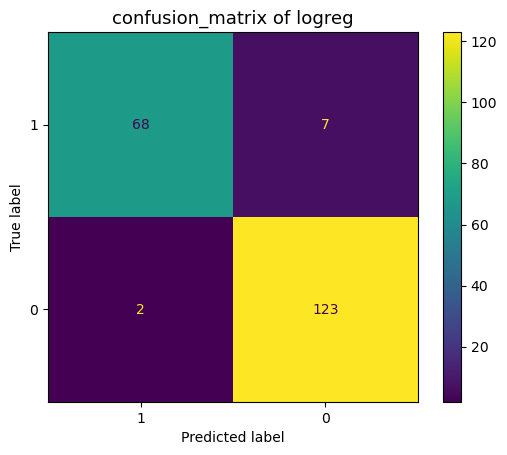

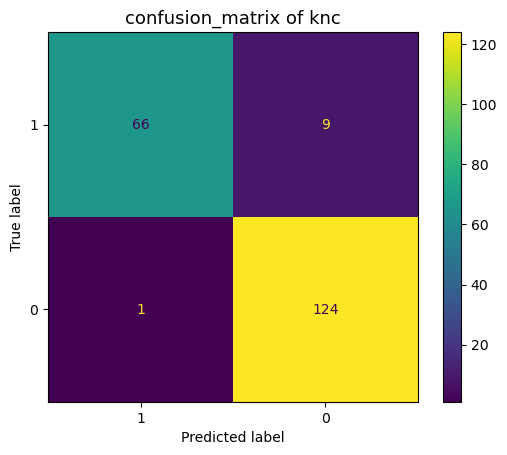

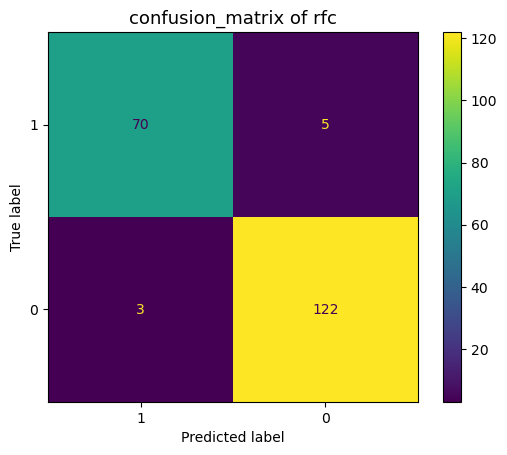

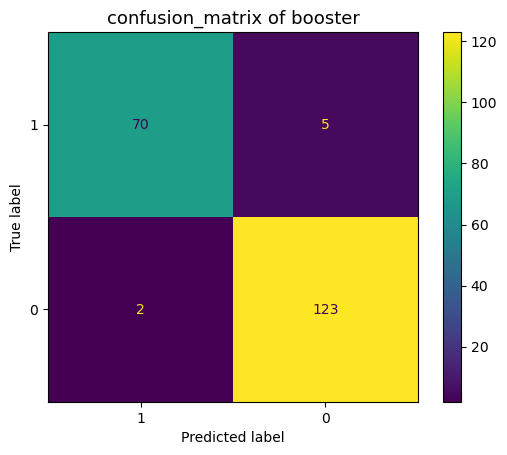

In [56]:
for i in range(4):
    conf_matr(pred_models, pred_models_title)

In [57]:
def roc_cur(pred_models, pred_models_title):    
    fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_models[i])
    plt.figure(figsize=(6, 6))

    plt.title(f'roc-curve of {pred_models_title[i]}', fontsize = 13)
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    

    plt.plot(fpr, tpr, color='palevioletred')
    plt.plot([0, 1], [0, 1], linestyle='--', color='green')

    plt.grid()
    plt.show()

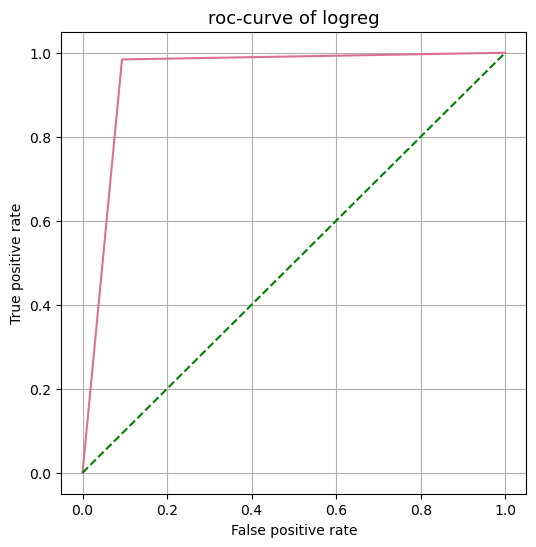

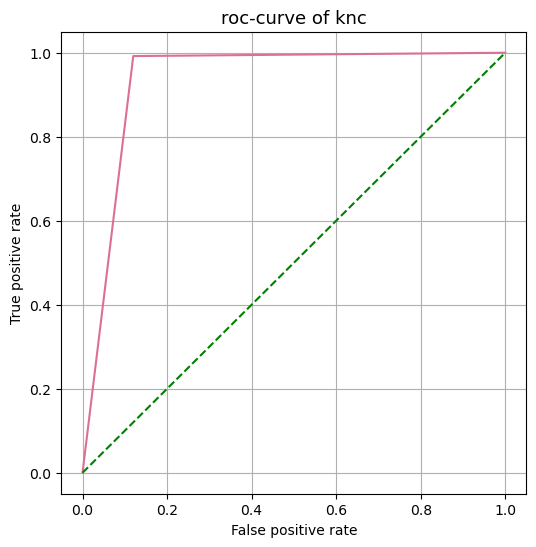

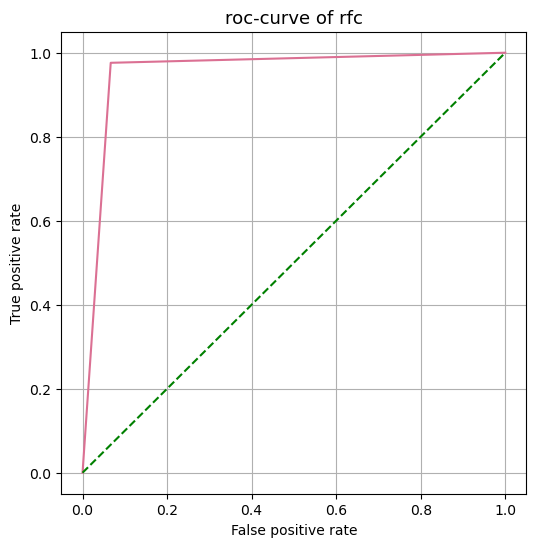

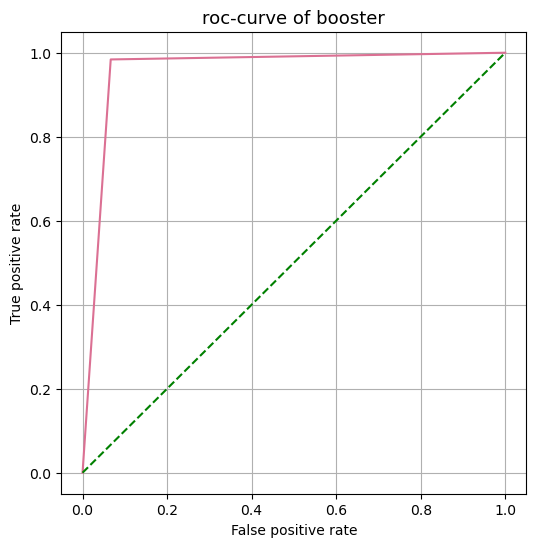

In [58]:
for i in range(4):
    roc_cur(pred_models, pred_models_title)

In [59]:
precisions = []
recalls = []
f1s = []
accuracies = []
roc_aucs = []

def metricss(pred_models):
    precisions.append(metrics.precision_score(y_test, pred_models[i]))
    recalls.append(metrics.recall_score(y_test, pred_models[i]))
    f1s.append(metrics.f1_score(y_test, pred_models[i]))
    accuracies.append(metrics.accuracy_score(y_test, pred_models[i]))
    roc_aucs.append(metrics.roc_auc_score(y_test, pred_models[i]))

In [60]:
for i in range(4):
    metricss(pred_models)

In [83]:
Metrics = pd.DataFrame(
    {'precisions': precisions,
     'recalls': recalls,
     'f1s': f1s,
     'accuracies': accuracies,
     'roc_aucs': roc_aucs,
    })
Metrics.rename(index={0: "logreg", 1: "knc", 2: "rfc", 3: 'booster'}, inplace=True)
Metrics

,precisions,recalls,f1s,accuracies,roc_aucs
logreg,0.946154,0.984,0.964706,0.955,0.945333
knc,0.932331,0.992,0.961240,0.950,0.936000
rfc,0.960630,0.976,0.968254,0.960,0.954667
booster,0.960938,0.984,0.972332,0.965,0.958667


* мы рассмотрим долю правильно найденных положительных объектов среди всех объектов положительного класса (recall), будем ориентироваться на эту метрику так как нам важно в нашей задаче, чтобы пропущенных опухолей было как можно меньше, таким образом, как ни странно, стоит выбрать классификатор к соседей.